# Trading strategies with JPMaQS

In this research notebook, we will explore how the JPMaQS data can be effectively used to construct and test trading strategies in conjunction with the `macrosynergy` package. The notebook demonstrates how to create a simple macro strategy, which uses customized indicators, such as excess inflation or excess credit growth, backtest it and evaluate its profitability.
Throughout the notebook, we will extensively leverage the `macrosynergy` package, particularly for preliminary data analysis, signal evaluation, and (naive) profit and loss (PnL) calculations. This notebook is the first one in a series of notebooks dedicated to various types of trading strategies aimed to make a profit by implementing strategies based on a simple macroeconomic theory using quantamental indicators.


The notebook covers the three main parts:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages that are used throughout the analysis. 

- Transformations and Checks: In this part, the notebook performs calculations and transformations on the data to derive the relevant signals and targets used for the analysis, including the normalization of feature variables using z-score or building a simple linear composite indicator. 

- Value Checks: This is the most critical section, where the notebook calculates and implements the trading strategies based on plausible hypotheses. This section involves backtesting a few simple but powerful trading strategies targeting. In particular, this notebook investigates how quantamental indicators, such as excess growth, inflation, credit growth, etc. can help generate trading signals for financial assets. In particular, this notebook looks into 4 simple macro strategies targeting subsequent monthly (or quarterly) vol targeted 2 and 5-year interest rate swap receiver returns:

    - __G2 directional macro trend__:  analysis of predictive power of macro trend pressure on subsequent interest rate swap receiver returns (on vol-targeted positions) in the two large currency areas - USD and EUR
    - __non-G2 directional macro trend__:  simple directional macro trend pressure and subsequent IRS receiver returns (on vol-targeted positions) in other currency areas 
    - __non-G2 relative to G2 macro trend__: predictive power of macro trends of the smaller countries relative to the G2 on vol-targeted IRS returns relative to similar returns in the G2
    - __global relative pressure factors__: checks the value of relative macro trends for each country versus an average of all other (available and tradable) countries on vol-targeted IRS returns relative to all available countries.


Some countless other possible indicators and approaches can be explored by users using even the limited free dataset. Users can modify the code to test different hypotheses and strategies based on their research and ideas. Best of luck with your research!


# 1. Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [2]:
! pip install git+https://github.com/macrosynergy/macrosynergy@develop

  Cloning https://github.com/macrosynergy/macrosynergy (to revision develop) to c:\users\jin_x\appdata\local\temp\pip-req-build-qt2rfod_
  Resolved https://github.com/macrosynergy/macrosynergy to commit e4056fcf8cfa965659299d7aabc73193dff9036d
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for macrosynergy: filename=macrosynergy-1.2.1.dev0+e4056fc-py3-none-any.whl size=460330 sha256=1e872d6c58faa24a1e2e1ffc677a43de0e2aa01db3550d945aa16bc8b3af08b5
  Stored in directory: C:\Users\jin_x\AppData\Local\Temp\pip-ephem-wheel-cache-of11eh4k\wheels\42\8e\1b\3720977af11deed4a4fc44597ff1223046d9e28a47c91bb946
Successfully built macrosynergy


  Running command git clone --filter=blob:none --quiet https://github.com/macrosynergy/macrosynergy 'C:\Users\jin_x\AppData\Local\Temp\pip-req-build-qt2rfod_'


# 1.1. Import packages and download JPMaQS

In [3]:
import numpy as np
import pandas as pd
import os
import sys
from pathlib import Path
sys.path.append(str(Path.cwd().parent))
print(str(Path.cwd().parent))
import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv

from macrosynergy.download import JPMaQSDownload

import warnings

warnings.simplefilter("ignore")


macrosynergy_fixed_income_returns_and_macro_trends_path = './kaggle'

print('Data source path:', macrosynergy_fixed_income_returns_and_macro_trends_path)
df = pd.read_csv(macrosynergy_fixed_income_returns_and_macro_trends_path + '\JPMaQS_Quantamental_Indicators.csv', index_col=0, parse_dates=['real_date'])
display (df.head(3))
df.info()

c:\finance\macrosynergy
Data source path: ./kaggle


,real_date,cid,xcat,value,grading,eop_lag,mop_lag
0,2000-01-03,AUD,CPIC_SA_P1M1ML12,1.244168,2.0,95.0,292.0
1,2000-01-04,AUD,CPIC_SA_P1M1ML12,1.244168,2.0,96.0,293.0
2,2000-01-05,AUD,CPIC_SA_P1M1ML12,1.244168,2.0,97.0,294.0


<class 'pandas.core.frame.DataFrame'>
Index: 3390059 entries, 0 to 3390058
Data columns (total 7 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
 4   grading    float64       
 5   eop_lag    float64       
 6   mop_lag    float64       
dtypes: datetime64[ns](1), float64(4), object(2)
memory usage: 206.9+ MB


The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md) or use the free dataset on [Kaggle](https://www.kaggle.com/datasets/macrosynergy/fixed-income-returns-and-macro-trends)

To ensure reproducibility, only samples between January 2000 (inclusive) and November 2023 (exclusive) are considered.

In [4]:
# Cross-sections of interest

cids_dm = ["AUD", "CAD", "CHF", "EUR", "GBP", "JPY", "NOK", "NZD", "SEK", "USD"]
cids_em = [
    "CLP",
    "COP",
    "CZK",
    "HUF",
    "IDR",
    "ILS",
    "INR",
    "KRW",
    "MXN",
    "PLN",
    "THB",
    "TRY",
    "TWD",
    "ZAR",
]
cids = cids_dm + cids_em
cids_du = cids_dm + cids_em
cids_dux = list(set(cids_du) - set(["IDR", "NZD"]))
cids_xg2 = list(set(cids_dux) - set(["EUR", "USD"]))

In [5]:
# Quantamental categories of interest

ecos = [
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P3M3ML3AR",
    "CPIC_SJA_P6M6ML6AR",
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P3M3ML3AR",
    "CPIH_SJA_P6M6ML6AR",
    "INFTEFF_NSA",
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
    "PCREDITGDP_SJA_D1M1ML12",
    "RGDP_SA_P1Q1QL4_20QMA",
    "PCREDITBN_SJA_P1M1ML12",
]
mkts = [
    "DU02YXR_NSA",
    "DU05YXR_NSA",
    "DU02YXR_VT10",
    "DU05YXR_VT10",
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
    "EQXR_NSA", # to use as a benchmark
    "GB10YXR_NSA" # to use as a benchmark
]



xcats = ecos + mkts

The description of each JPMaQS category is available either under [Macro Quantamental Academy](https://academy.macrosynergy.com/quantamental-indicators/), [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected), or on [Kaggle](https://www.kaggle.com/datasets/macrosynergy/fixed-income-returns-and-macro-trends) (just for the tickers used in this notebook). In particular, the set used for this notebook is using [Consumer price inflation trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Consumer%20price%20inflation%20trends.php), [Inflation targets](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Inflation%20targets.php), [Intuitive growth estimates](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Intuitive%20growth%20estimates.php), [Domestic credit ratios](https://academy.macrosynergy.com/academy/Themes/Macroeconomic%20balance%20sheets/_build/html/notebooks/Domestic%20credit%20ratios.php), [Long-term GDP growth](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Long-term%20GDP%20growth.php), [Private credit expansion](https://academy.macrosynergy.com/academy/Themes/Financial%20conditions/_build/html/notebooks/Private%20credit%20expansion.php), [Duration returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Duration%20returns.php), and [FX tradeability and flexibility](https://academy.macrosynergy.com/academy/Themes/Stylized%20trading%20factors/_build/html/notebooks/FX%20tradeability%20and%20flexibility.php)

In [6]:
# load the dataset:

#df = pd.read_csv('../input/fixed-income-returns-and-macro-trends/JPMaQS_Quantamental_Indicators.csv', index_col=0, parse_dates=['real_date'])

scols = ["cid", "xcat", "real_date", "value"]  # required columns
df = df[scols].copy()

df['ticker'] = df['cid'] + "_" + df["xcat"]
display (df.tail(3))
display(df['cid'].unique())
display(df['xcat'].unique())
df.info()

,cid,xcat,real_date,value,ticker
3390056,ZAR,RYLDIRS05Y_NSA,2023-12-11,3.344046,ZAR_RYLDIRS05Y_NSA
3390057,ZAR,RYLDIRS05Y_NSA,2023-12-12,3.283972,ZAR_RYLDIRS05Y_NSA
3390058,ZAR,RYLDIRS05Y_NSA,2023-12-13,3.279850,ZAR_RYLDIRS05Y_NSA


array(['AUD', 'CAD', 'CHF', 'CLP', 'COP', 'CZK', 'EUR', 'GBP', 'HUF',
       'IDR', 'ILS', 'INR', 'JPY', 'KRW', 'MXN', 'NOK', 'NZD', 'PLN',
       'SEK', 'THB', 'TRY', 'TWD', 'USD', 'ZAR'], dtype=object)

array(['CPIC_SA_P1M1ML12', 'CPIC_SJA_P3M3ML3AR', 'CPIC_SJA_P6M6ML6AR',
       'CPIH_SA_P1M1ML12', 'CPIH_SJA_P3M3ML3AR', 'CPIH_SJA_P6M6ML6AR',
       'DU02YXR_NSA', 'DU02YXR_VT10', 'DU05YXR_NSA', 'DU05YXR_VT10',
       'EQXR_NSA', 'EQXR_VT10', 'FXCRR_NSA', 'FXTARGETED_NSA',
       'FXUNTRADABLE_NSA', 'FXXR_NSA', 'FXXR_VT10', 'INFTEFF_NSA',
       'INTRGDP_NSA_P1M1ML12_3MMA', 'INTRGDPv5Y_NSA_P1M1ML12_3MMA',
       'PCREDITBN_SJA_P1M1ML12', 'PCREDITGDP_SJA_D1M1ML12',
       'RGDP_SA_P1Q1QL4_20QMA', 'RYLDIRS02Y_NSA', 'RYLDIRS05Y_NSA'],
      dtype=object)

<class 'pandas.core.frame.DataFrame'>
Index: 3390059 entries, 0 to 3390058
Data columns (total 5 columns):
 #   Column     Dtype         
---  ------     -----         
 0   cid        object        
 1   xcat       object        
 2   real_date  datetime64[ns]
 3   value      float64       
 4   ticker     object        
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 155.2+ MB


In [7]:
#  uncomment if running on Kaggle
"""for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
                                                   
df = pd.read_csv('../input/fixed-income-returns-and-macro-trends/JPMaQS_Quantamental_Indicators.csv', index_col=0, parse_dates=['real_date'])"""

"for dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\n                                                   \ndf = pd.read_csv('../input/fixed-income-returns-and-macro-trends/JPMaQS_Quantamental_Indicators.csv', index_col=0, parse_dates=['real_date'])"

# 1.2. Availability

It is essential to assess data availability before conducting any analysis. It allows identifying any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available and determining the appropriate periods for analysis. 

The [`missing_in_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#detect-missing-categories-or-cross-sections-with-missing-in-df) function in `macrosynergy.management` allows the user to quickly check whether or not all requested categories have been downloaded.

In [8]:
msm.missing_in_df(df, xcats=xcats, cids=cids)

Missing XCATs across DataFrame:  ['GB10YXR_NSA']
Missing cids for CPIC_SA_P1M1ML12:              []
Missing cids for CPIC_SJA_P3M3ML3AR:            []
Missing cids for CPIC_SJA_P6M6ML6AR:            []
Missing cids for CPIH_SA_P1M1ML12:              []
Missing cids for CPIH_SJA_P3M3ML3AR:            []
Missing cids for CPIH_SJA_P6M6ML6AR:            []
Missing cids for DU02YXR_NSA:                   []
Missing cids for DU02YXR_VT10:                  []
Missing cids for DU05YXR_NSA:                   []
Missing cids for DU05YXR_VT10:                  []
Missing cids for EQXR_NSA:                      ['CLP', 'COP', 'CZK', 'HUF', 'IDR', 'ILS', 'NOK', 'NZD']
Missing cids for FXTARGETED_NSA:                ['USD']
Missing cids for FXUNTRADABLE_NSA:              ['USD']
Missing cids for INFTEFF_NSA:                   []
Missing cids for INTRGDP_NSA_P1M1ML12_3MMA:     []
Missing cids for INTRGDPv5Y_NSA_P1M1ML12_3MMA:  []
Missing cids for PCREDITBN_SJA_P1M1ML12:        []
Missing cids for PCR

The [`check_availability()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#view-available-data-history-with-check-availability) function in `macrosynergy.management` displays the start dates from which each category is available for each requested country, as well as missing dates or unavailable series.

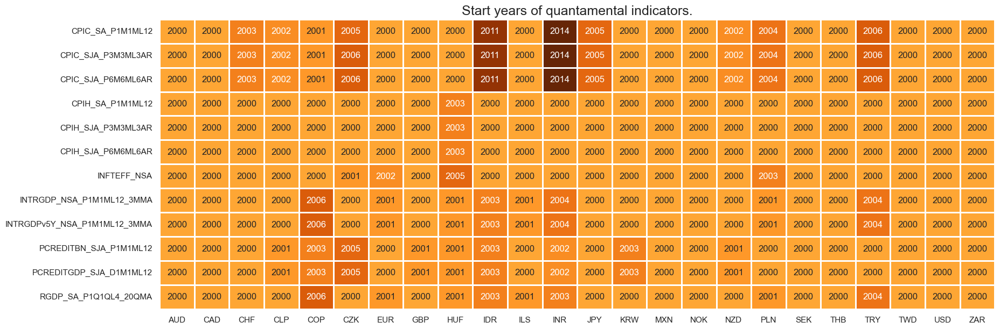

In [9]:
# indicator availability
plot = msm.check_availability(
    df,
    xcats=ecos,
    cids=cids,
    start_size=(20, 7),
    start_years=True,
    missing_recent=False,
)

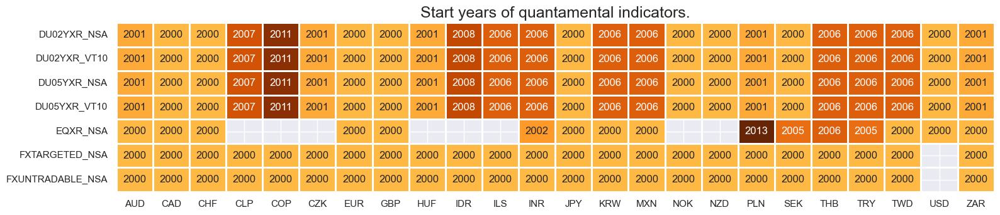

In [10]:
# return availability
msm.check_availability(df, xcats=mkts, cids=cids, missing_recent=False)

# 1.3. Exclude series sections with make_blacklist

Before running the analysis, we use [`make_blacklist()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#exclude-series-sections-with-make-blacklist) helper function from `macrosynergy` package, which creates a standardized dictionary of blacklist periods, i.e. periods that affect the validity of an indicator, based on standardized panels of binary categories.

Put simply, this function allows converting category variables into blacklist dictionaries that can then be passed to other functions. Below, we picked two indicators for FX tradability and flexibility. `FXTARGETED_NSA` is an exchange rate target dummy, which takes a value of 1 if the exchange rate is targeted through a peg or any regime that significantly reduces exchange rate flexibility and 0 otherwise. `FXUNTRADABLE_NSA` is also a dummy variable that takes the value one if liquidity in the main FX forward market is limited or there is a distortion between tradable offshore and untradable onshore contracts.

In [11]:
dfb = df[df["xcat"].isin(["FXTARGETED_NSA", "FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'CHF': (Timestamp('2011-10-03 00:00:00'), Timestamp('2015-01-30 00:00:00')),
 'CZK': (Timestamp('2014-01-01 00:00:00'), Timestamp('2017-07-31 00:00:00')),
 'ILS': (Timestamp('2000-01-03 00:00:00'), Timestamp('2005-12-30 00:00:00')),
 'INR': (Timestamp('2000-01-03 00:00:00'), Timestamp('2004-12-31 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('2008-11-28 00:00:00')),
 'TRY_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2003-09-30 00:00:00')),
 'TRY_2': (Timestamp('2020-01-01 00:00:00'), Timestamp('2023-12-13 00:00:00'))}

# 2. Transformations and checks

# 2.1. Features

# 2.1.1. Excess growth

Recent annual GDP growth rate trends versus 5-year medians are used as proxies for strong versus weak growth by local standards and are provided directly by JPMaQS. These excess growth indicators are less elaborate than GDP growth versus estimated potential growth but are more objective and less susceptible to look-ahead biases in model design. They are also a plausible intuitive proxy for how the public and policymakers perceive growth. The macrosynergy package provides two useful functions, [`view_ranges()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-time-series-with-view-timelines), which facilitate convenient data visualization for selected indicators and cross-sections. These functions assist in plotting means, standard deviations, and time series of the chosen indicators.

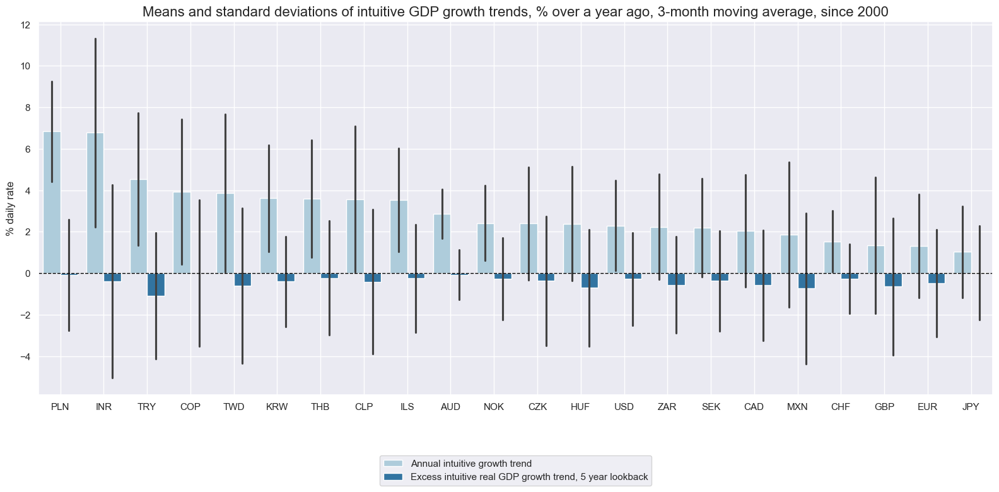

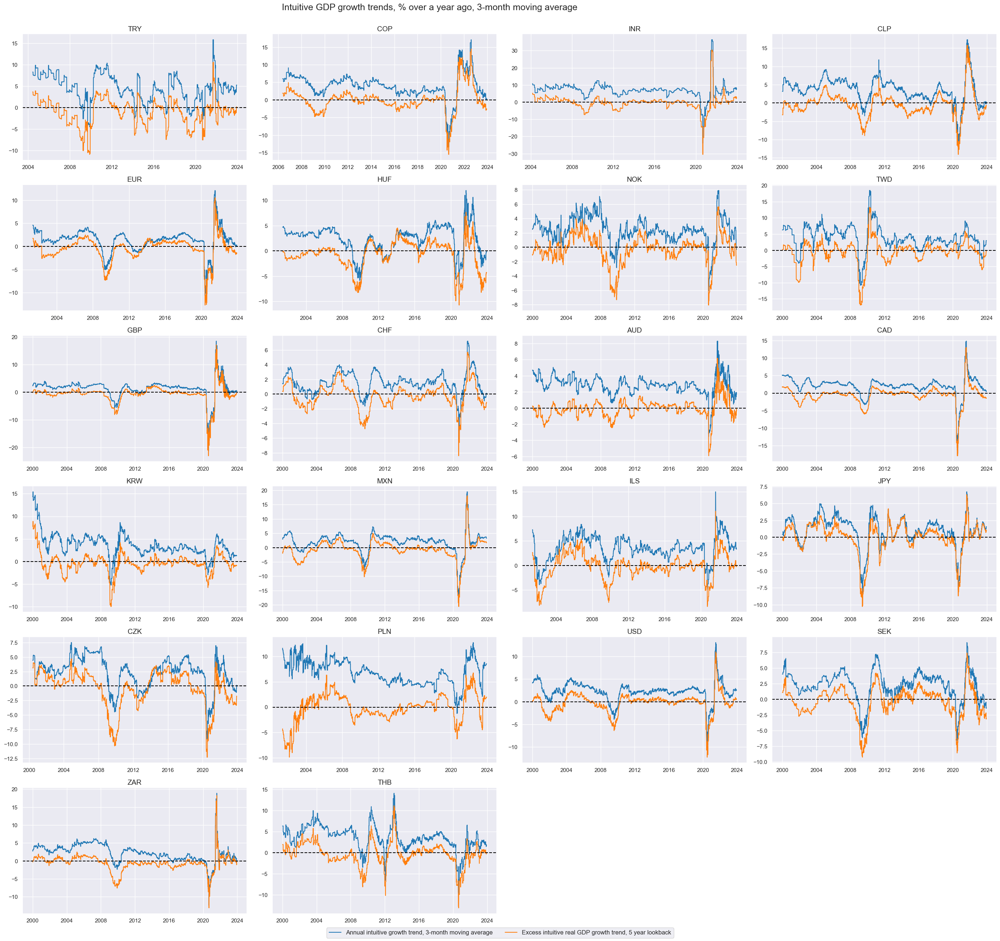

In [12]:
xcatx = ["INTRGDP_NSA_P1M1ML12_3MMA", "INTRGDPv5Y_NSA_P1M1ML12_3MMA"]
cidx = cids_dux
start_date = "2000-01-01"

msp.view_ranges(
    df,
    cids=cidx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    ylab="% daily rate",
    start=start_date,
    title="Means and standard deviations of intuitive GDP growth trends, % over a year ago, 3-month moving average, since 2000",
    xcat_labels=[
        "Annual intuitive growth trend",
        "Excess intuitive real GDP growth trend, 5 year lookback",
    ],
)
msp.view_timelines(
    df,
    xcats=xcatx,
    cids=cids_dux,
    ncol=4,
    cumsum=False,
    start=start_date,
    same_y=False,
    all_xticks=True,
    title_xadj=0.43,
    title="Intuitive GDP growth trends, % over a year ago, 3-month moving average",
    xcat_labels=[
        "Annual intuitive growth trend, 3-month moving average",
        "Excess intuitive real GDP growth trend, 5 year lookback",
    ],
)

# 2.1.2. Excess inflation

Most quantamental indicators that professional investment managers would deploy require careful customization and transformations of original JPMaQS data. Since all quantamental data are standardized information states over a range of countries, transformations are simple.

The [`panel_calculator()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#create-new-category-panels-with-panel-calculator) function in `macrosynergy.panel` makes it easy and intuitive to apply a wide range of transformations to each cross section of a panel by using a string. The main rules are:

* Consider the category ticker as a symbolic representation of the respective panel i.e. time series dataframe of all cross sections of the category.
* Use standard Python and `pandas` expressions to engineer new features. 

See below for examples of these rules in action: we calculate plausible metrics of excess inflation versus a country's effective inflation target. [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) function adds the new indicators to the original dataframe `df`.

In [13]:
# Preparation: for relative target deviations, we need denominator bases that should never be less than 2

dfa = msp.panel_calculator(df, ["INFTEBASIS = INFTEFF_NSA.clip(lower=2)"], cids=cids_du)
df = msm.update_df(df, dfa)

# Calculate absolute and relative target deviations for a range of CPI inflation metrics

infs = [
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",
    "CPIH_SJA_P3M3ML3AR",
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
    "CPIC_SJA_P3M3ML3AR",
]
for inf in infs:
    calcs = [
        f"{inf}vIET = ( {inf} - INFTEFF_NSA )",
        f"{inf}vIETR = ( {inf} - INFTEFF_NSA ) / INFTEBASIS",
    ]

    dfa = msp.panel_calculator(df, calcs=calcs, cids=cids_du)
    df = msm.update_df(df, dfa)

# Average excess inflation metrics across three different standard horizons

calcs = []
for cp in ["CPIH", "CPIC"]:
    for v in ["vIET", "vIETR"]:
        calc = f"{cp}_SA_PALL{v} = ( {cp}_SA_P1M1ML12{v} + {cp}_SJA_P6M6ML6AR{v} + {cp}_SJA_P3M3ML3AR{v} ) / 3"
        calcs += [calc]

dfa = msp.panel_calculator(df, calcs, cids=cids_du)
df = msm.update_df(df, dfa)

Annual and "6m/6m" seasonally and jump-adjusted inflation rates mainly display large and medium-term cycles. The short-term "3m/3m" seasonally and jump-adjusted rates are a lot more volatile. [`view_timelines()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-time-series-with-view-timelines) is employed to display the history.

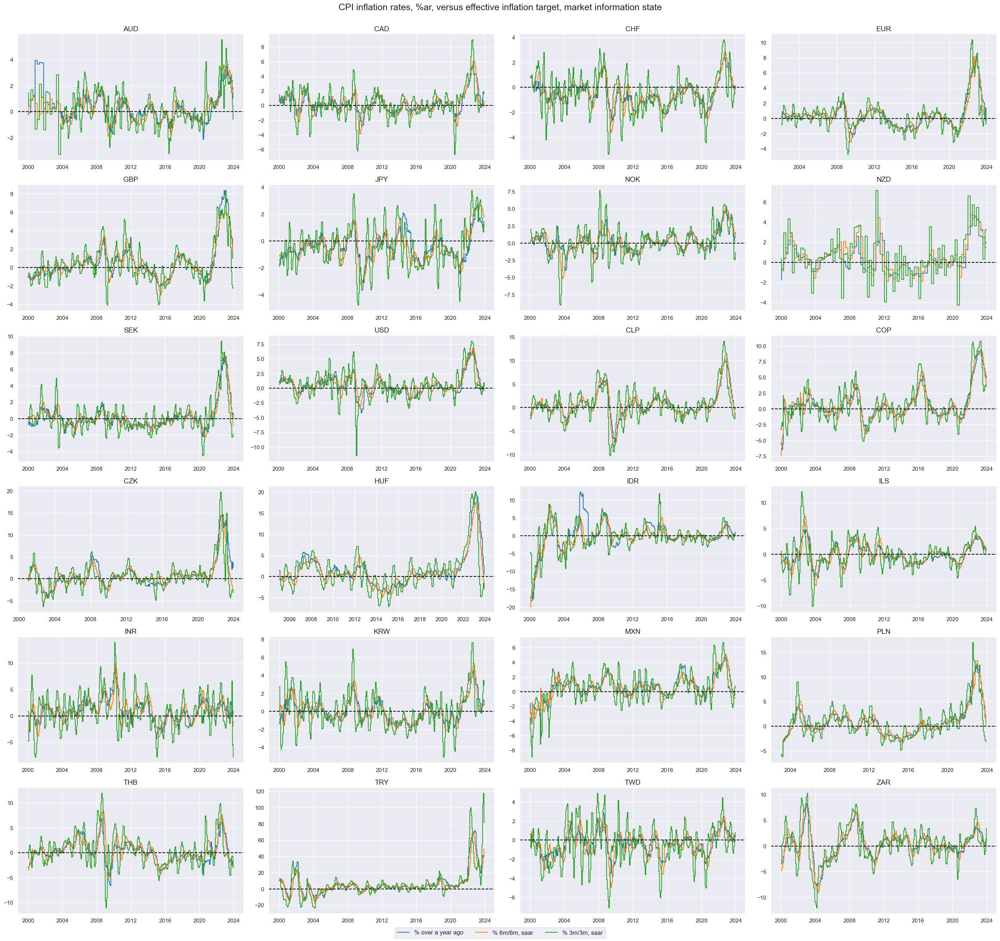

In [14]:
xcatx = ["CPIH_SA_P1M1ML12vIET", "CPIH_SJA_P6M6ML6ARvIET", "CPIH_SJA_P3M3ML3ARvIET"]
cidx = cids_du

msp.view_timelines(
    df,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=start_date,
    same_y=False,
    all_xticks=True,
    title="CPI inflation rates, %ar, versus effective inflation target, market information state",
    xcat_labels=["% over a year ago", "% 6m/6m, saar", "% 3m/3m, saar"],
)

The use of relative excess inflation makes time series comparable across high and low inflation countries.

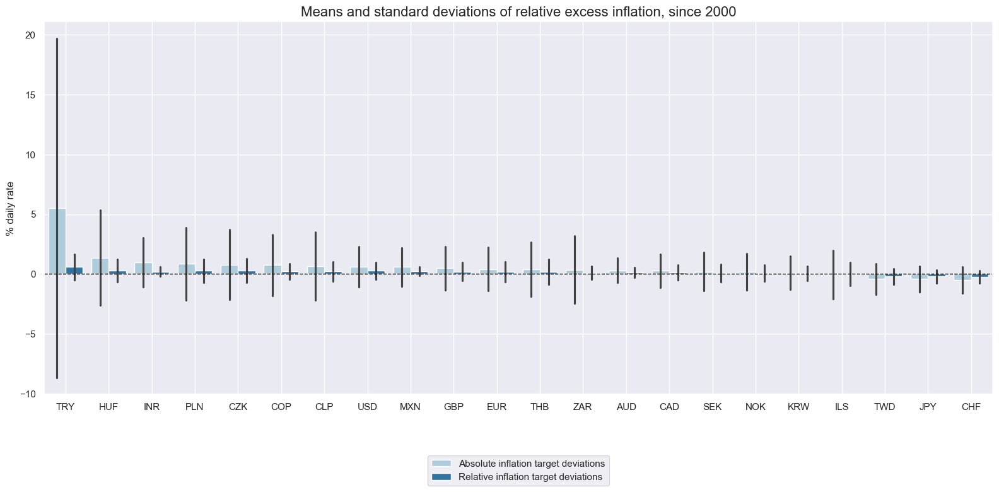

In [15]:
xcatx = ["CPIH_SA_PALLvIET", "CPIH_SA_PALLvIETR"]
cidx = cids_dux

msp.view_ranges(
    df,
    cids=cidx,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    ylab="% daily rate",
    start="2000-01-01",
    title="Means and standard deviations of relative excess inflation, since 2000",
    xcat_labels=[
        "Absolute inflation target deviations",
        "Relative inflation target deviations",
    ],
)

# 2.1.3. Excess credit growth

Similar to excess inflation, excess credit growth metrics require transformations and a neutral benchmark. A neutral benchmark here serves as a medium-term nominal GDP growth estimate, calculated as the sum of the past 5-years' growth and the effective estimated inflation target. [`panel_calculator()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#create-new-category-panels-with-panel-calculator) and [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) are employed to calculate the new indicators and add them to the original dataframe `df`.

In [16]:
dfa = msp.panel_calculator(
    df,
    ["PCBASIS = INFTEFF_NSA + RGDP_SA_P1Q1QL4_20QMA"],
    cids=cids_du,
)
df = msm.update_df(df, dfa)

pcgs = [
    "PCREDITBN_SJA_P1M1ML12",
    "PCREDITGDP_SJA_D1M1ML12",
]
for pcg in pcgs:
    calc_pcx = f"{pcg}vLTB = {pcg} - PCBASIS "
    dfa = msp.panel_calculator(df, calcs=[calc_pcx], cids=cids_du)
    df = msm.update_df(df, dfa)

Excess ratios based on expansion relative to GDP and a nominal GDP benchmark are not plausible metrics for the central bank because the initial leverage of the economy strongly affects the expansion rate and must plausibly be considered for the benchmark. Put economically, countries with bank leverage will always produce low rates versus a nominal GDP growth benchmark and part of that shortfall may reflect other channels of leverage outside the banking system, just as the credit markets in the U.S. The macrosynergy package provides two useful functions, [`view_ranges()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-time-series-with-view-timelines), which assist in plotting means, standard deviations, and time series of the chosen indicators.

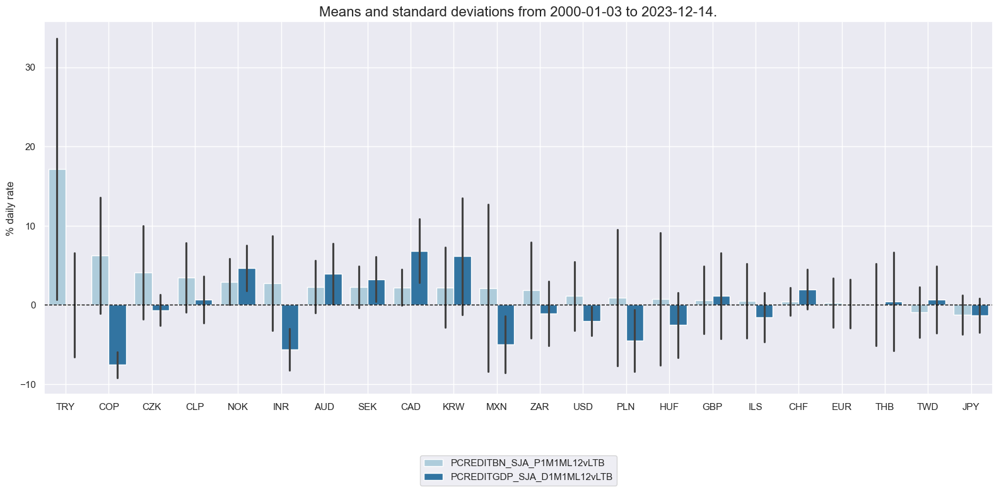

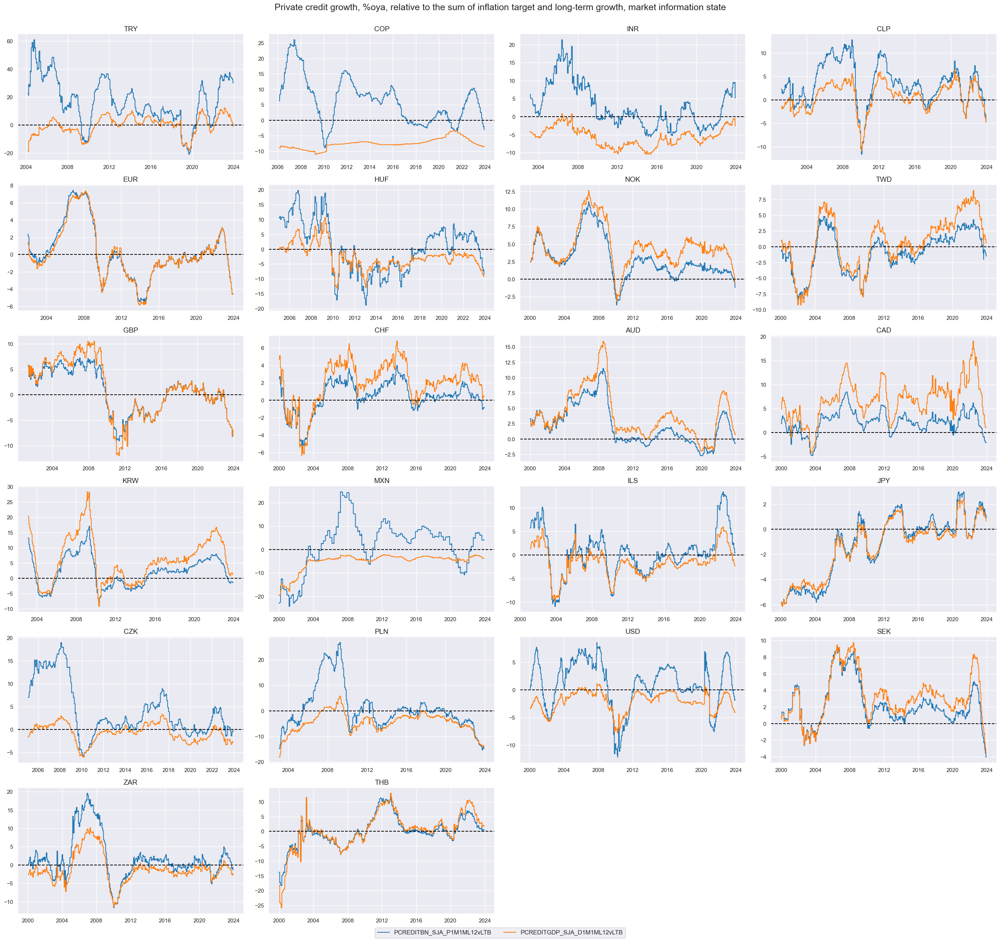

In [17]:
xcatx = ["PCREDITBN_SJA_P1M1ML12vLTB", "PCREDITGDP_SJA_D1M1ML12vLTB"]

msp.view_ranges(
    df,
    cids=cids_dux,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    ylab="% daily rate",
    start="2000-01-01",
)
msp.view_timelines(
    df,
    xcats=xcatx,
    cids=cids_dux,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    all_xticks=True,
    title="Private credit growth, %oya, relative to the sum of inflation target and long-term growth, market information state",
)

# 2.1.4. Composite macro trend pressure

For simple proof of concept, we can just add up excess growth, inflation and credit expansion, using the most common metrics. This gives a simple first-shot candidate for a trading signal. Whilst optimization may improve the information content, the empirical evidence for the "simplest plausible" indicators is often a more reliable and less biased indicator of the value proposition. [`panel_calculator()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#create-new-category-panels-with-panel-calculator) makes it easy and intuitive to apply the calculation to each cross-section. 

The composite indicators currently used are simple averages, which means they are not refined to optimize their performance as trading signals. To enhance the quality of these signals, one could employ machine learning techniques to design more sophisticated indicators. For instance, a statistical learning approach could be implemented where an optimal method for feature selection is identified sequentially. This method involves evaluating different scoring techniques to determine which is most effective, and then applying this optimal method to select features at each recalibration date. The outcome of this process is that the optimal signal at each recalibration point is computed as an equally weighted average of the features deemed most effective by the chosen model. Therefore, rather than relying on a simple average, this approach refines the selection process and constructs a more targeted and potentially more effective indicator based on the best performing model recommendations up to that recalibration date. This approach was explained and tested in the post ["Optimizing macro trading signals – A practical introduction"](https://macrosynergy.com/research/optimal-signals/).

In this post, we focus solely on testing straightforward, non-optimized, and intuitively straightforward indicators: 

- `XGHI` the average of excess inflation and economic growth, %ar, end-of-month information state,
- `XGHIPC`, the average of excess inflation, economic growth, and excess credit growth, %ar, end-of-month information state,

comparing them to their underlying components.

In [18]:
calcs = [
    "XGHI = ( INTRGDPv5Y_NSA_P1M1ML12_3MMA + CPIH_SA_PALLvIET ) / 2",
    "XGHIPC = ( INTRGDPv5Y_NSA_P1M1ML12_3MMA + CPIH_SA_PALLvIET + PCREDITBN_SJA_P1M1ML12vLTB ) / 3",
]

dfa = msp.panel_calculator(df, calcs, cids=cids_du)
df = msm.update_df(df, dfa)

The resulting composite macro trend pressure indicators `"XGHI"` and  `"XGHIPC"` can be displayed using [`view_ranges()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-distributions-with-view-ranges) and [`view_timelines()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-panel-time-series-with-view-timelines):

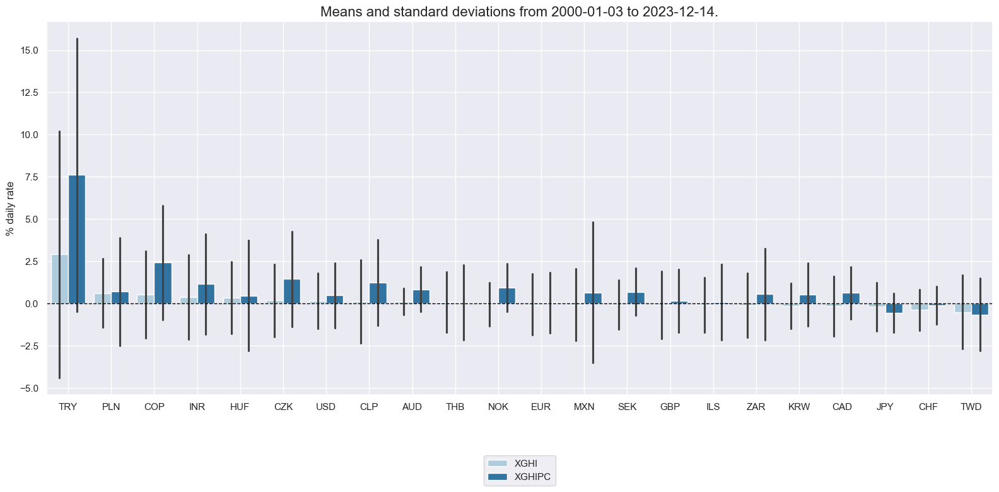

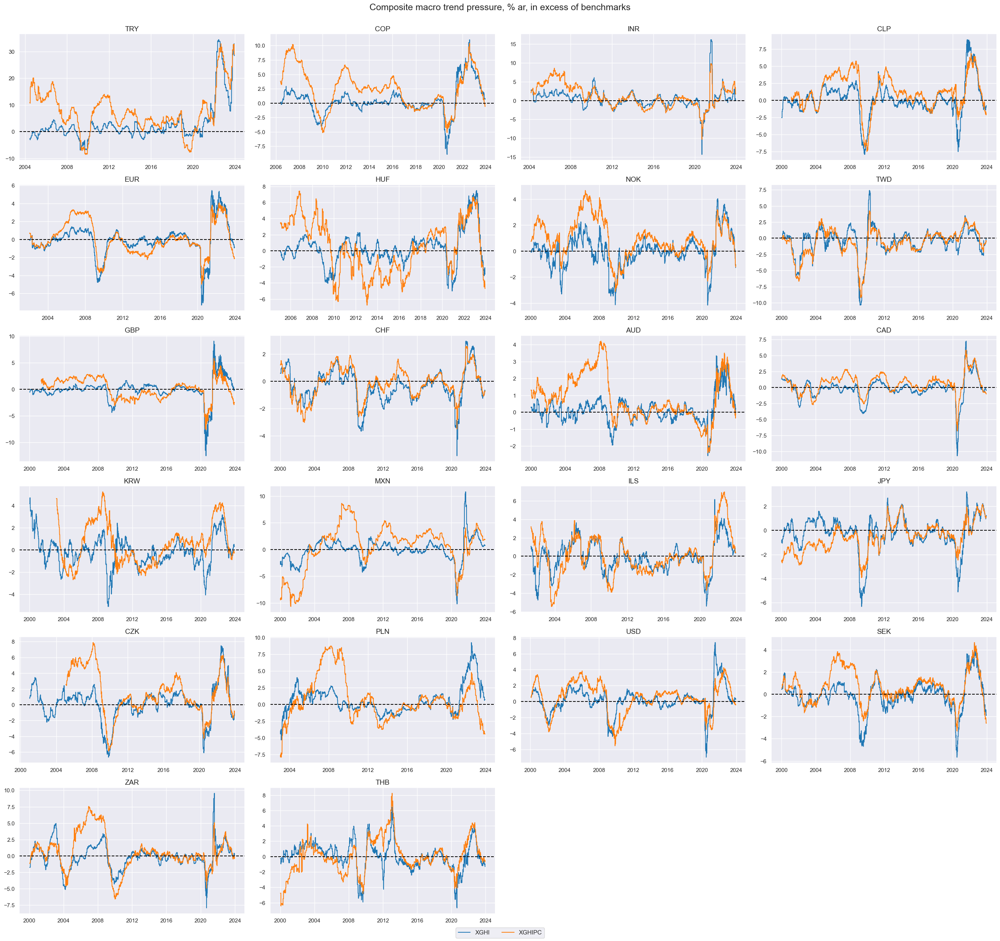

In [19]:
xcatx = ["XGHI", "XGHIPC"]

msp.view_ranges(
    df,
    cids=cids_dux,
    xcats=xcatx,
    kind="bar",
    sort_cids_by="mean",
    ylab="% daily rate",
    start="2000-01-01",
)
msp.view_timelines(
    df,
    xcats=xcatx,
    cids=cids_dux,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    all_xticks=True,
    title="Composite macro trend pressure, % ar, in excess of benchmarks",
)

It is often important to assess if the strategy signal tends to give rise to a common direction of exposure across markets or rather to relative positions across currency areas.

The function [`correl_matrix()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#visualize-relations-across-sections-or-categories-with-correl-matrix) of the `macrosynergy.panel` module allows to quickly visualize the historic international correlation of the signal category.

In the case of composite excess macro trends, the correlation across currency areas has been predominantly positive, with very few exceptions for some pairs of emerging countries.

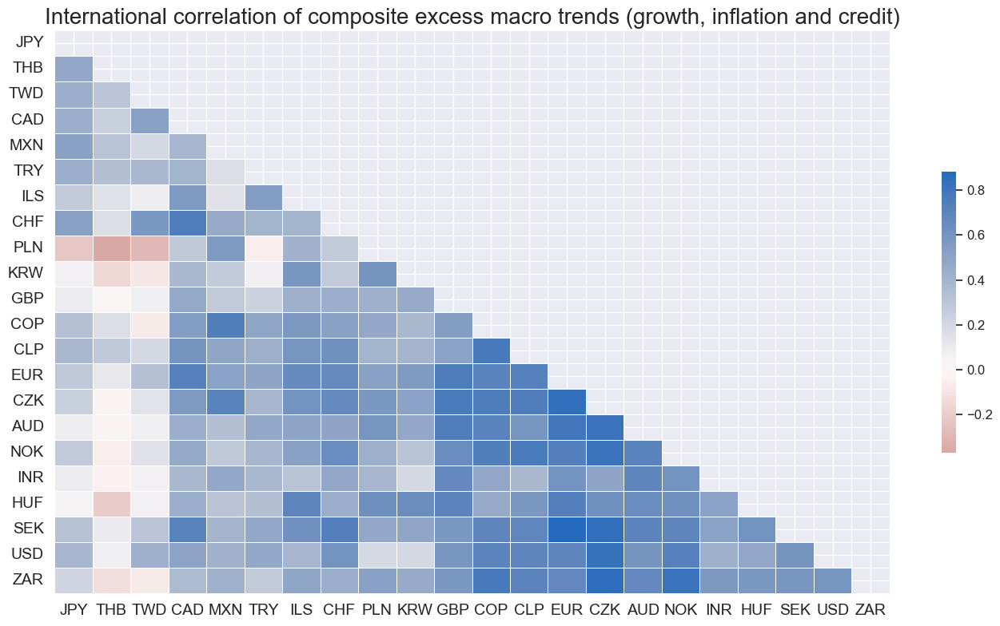

In [20]:
xcat = "XGHIPC"
msp.correl_matrix(
    df,
    xcats=xcat,
    cids=cids_dux,
    start="2000-01-01",
    cluster=True,
    title="International correlation of composite excess macro trends (growth, inflation and credit)",
)

# 2.1.5. Small country hybrid trend pressure

Plausibly smaller countries policy and markets are affected by both their own macro trends and those in the dominant market, as the latter have a critical influence on global financial conditions and - therefore - on local conditions.

Here we account for this in a crude way, by average local and G2 excess macro trends for the smaller countries and assuming that the smaller countries do not affect the G2.

Note that the [`panel_calculator()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#create-new-category-panels-with-panel-calculator) function can integrate individual cross-section series in calculations by prefixing them with `i`. In the example below, the individual series is added to each cross section of the panel. [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) is used to add the calculated indicators to the original dataframe `df`.

In [21]:
calcs = [
    "XGHI_SCH = ( XGHI + 0.5 * iUSD_XGHI +  0.5 * iEUR_XGHI ) / 2",
    "XGHIPC_SCH = ( XGHIPC + 0.5 * iUSD_XGHIPC +  0.5 * iEUR_XGHIPC ) / 2",
]

dfa = msp.panel_calculator(df, calcs, cids=cids_xg2)
df = msm.update_df(df, dfa)

# 2.1.6. Relative macro trend pressure versus G2

Due to their size, the G2 is likely to dominate the impact of macro trends on cross-section fixed income returns.
In order to put greater emphasis on the information content non-G2 idiosyncratic trends, one can calculate these trends (and related returns) relative to the G2.

The convenience function [`make_relative_value()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#compute-panels-versus-basket-with-make-relative-value) of the `macrosynergy.panel` module calculates values relative to an equally-weighted basket while adapting to missing periods of any of the basket cross sections. [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) function in the `macrosynergy` management module concatenates two JPMaQS data frames, effectively adding the newly calculated relative indicators with postfix `vG2` to the original data frame `df`.

In [22]:
xcatx = [
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
    "CPIC_SA_PALLvIET",
    "CPIH_SA_PALLvIET",
    "PCREDITBN_SJA_P1M1ML12vLTB",
    "PCREDITGDP_SJA_D1M1ML12vLTB",
    "XGHI",
    "XGHIPC",
]

dfa = msp.make_relative_value(
    df, xcats=xcatx, cids=cids_dux, basket=["EUR", "USD"], postfix="vG2"
)

df = msm.update_df(df, dfa)

Relative macro trends have very different dynamics, as exemplified by the relative excess growth trends below.

P.S.: Inspection of the below series emphasizes a potential weakness of their use as trading signal and basis of strategy research. Large fluctuations, in relative and absolute terms, are concentrated on the 2020/21 disruptions due to the COVID pa

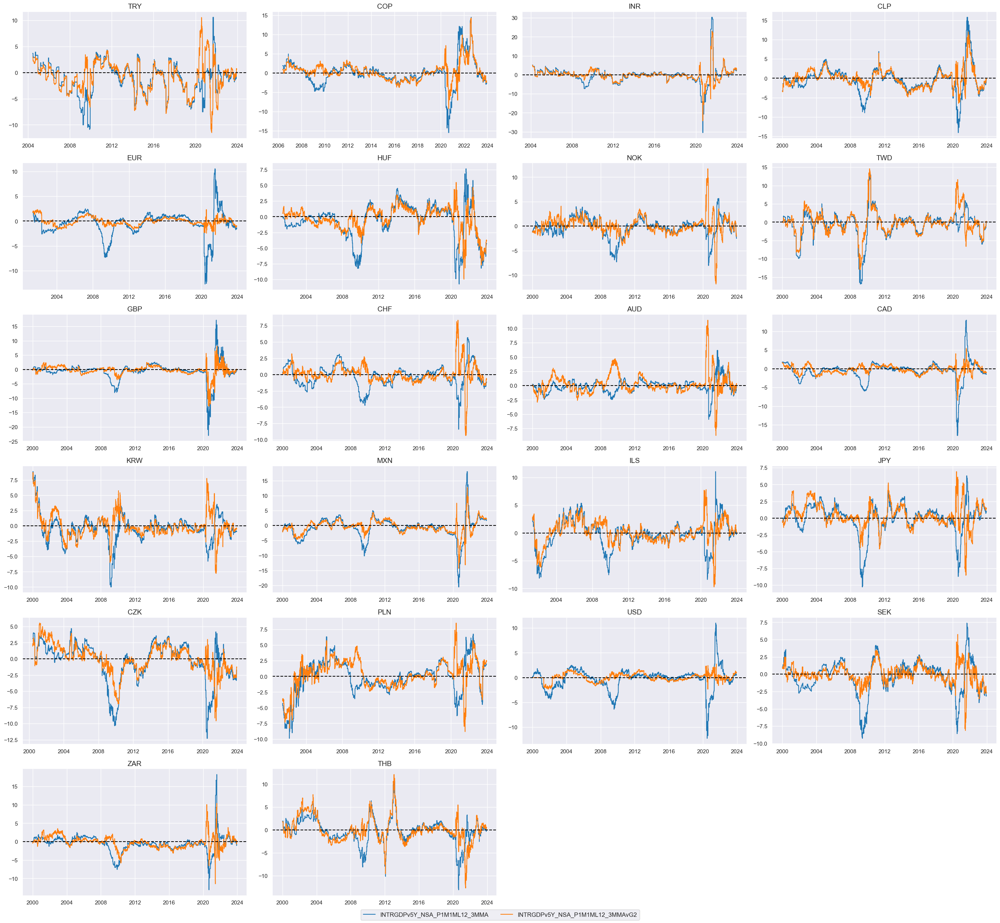

In [23]:
xcatx = ["INTRGDPv5Y_NSA_P1M1ML12_3MMA", "INTRGDPv5Y_NSA_P1M1ML12_3MMAvG2"]
cidx = cids_xg2

msp.view_timelines(
    df,
    xcats=xcatx,
    cids=cids_dux,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    all_xticks=True,
)

Using relative values significantly reduces the positive correlations across non-G2 cross sections.

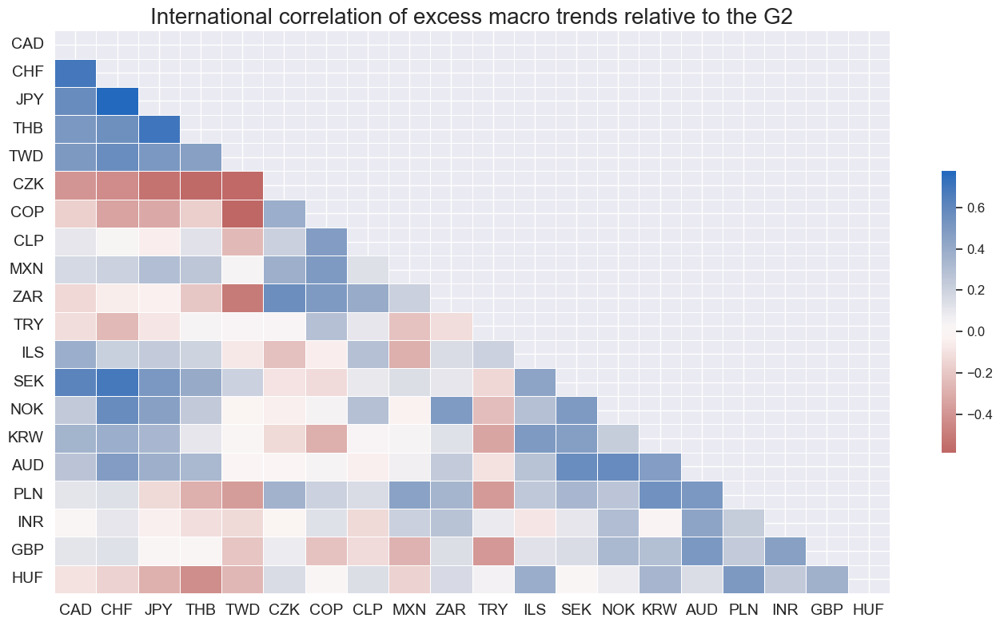

In [24]:
xcat = "XGHIPCvG2"
msp.correl_matrix(
    df,
    xcats=xcat,
    cids=cids_xg2,
    start="2000-01-01",
    cluster=True,
    title="International correlation of excess macro trends relative to the G2",
)

# 2.1.7. Global relative macro trend pressure

Another way of generating relative macro trends is calculating differences versus a basket of all available or tradable markets at each time. The benefit of this approach is that it further enhances the influence of small countries' idiosyncratic trends and reduces the correlation of cross-sectional signals. The disadvantage is that the meaning and quality of underlying data vary across countries, and relative trends in the data are less reliable indicators of actual trends. As before, [`make_relative_value()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#compute-panels-versus-basket-with-make-relative-value) and [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) are used to calculate new relative macro trend pressure indicators with postfix `vGLB` and add them to the original dataframe `df`.

In [25]:
xcatx = [
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
    "CPIC_SA_PALLvIET",
    "CPIH_SA_PALLvIET",
    "PCREDITBN_SJA_P1M1ML12vLTB",
    "PCREDITGDP_SJA_D1M1ML12vLTB",
    "XGHI",
    "XGHIPC",
]

dfa = msp.make_relative_value(
    df,
    xcats=xcatx,
    cids=cids_dux,
    rel_xcats=[xc + "vGLB" for xc in xcatx],
)
df = msm.update_df(df, dfa)

Relative trends to a broad basket have similar broad cycles and long-term patterns as trends relative to G2 but also occasional notable differences.

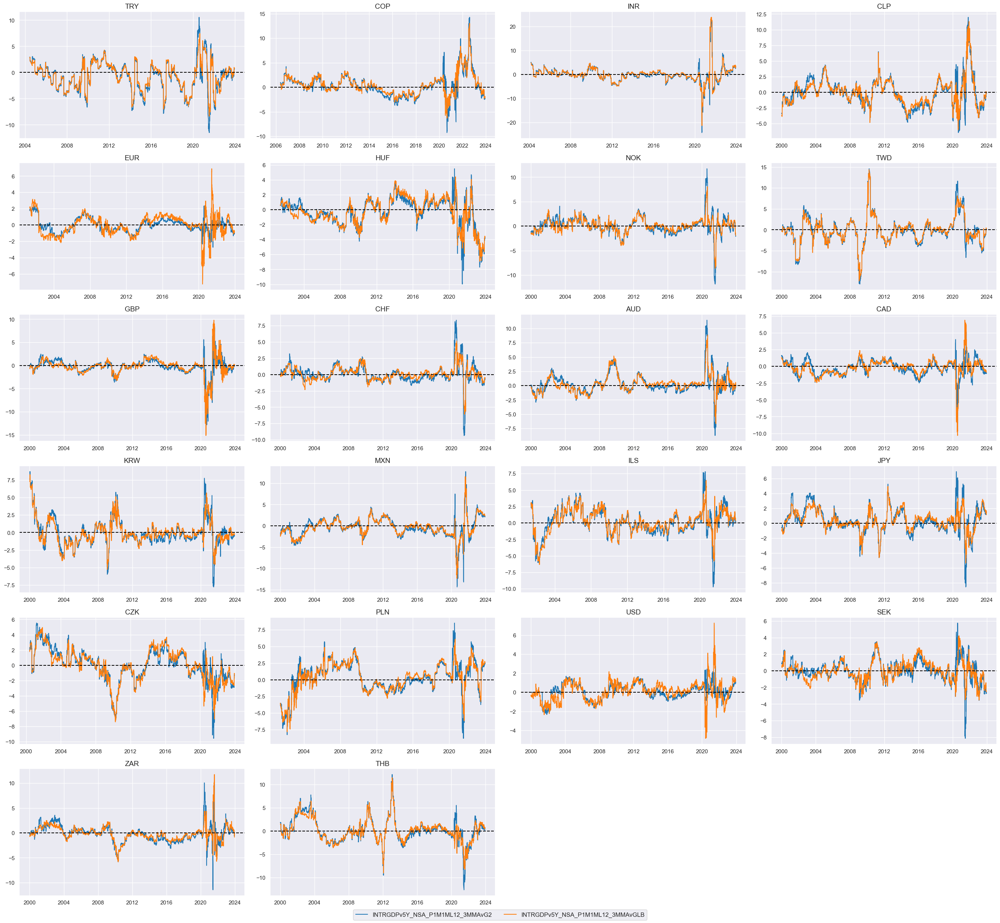

In [26]:
xcatx = ["INTRGDPv5Y_NSA_P1M1ML12_3MMAvG2", "INTRGDPv5Y_NSA_P1M1ML12_3MMAvGLB"]
cidx = cids_xg2

msp.view_timelines(
    df,
    xcats=xcatx,
    cids=cids_dux,
    ncol=4,
    cumsum=False,
    start="2000-01-01",
    same_y=False,
    all_xticks=True,
)

# 2.2. Targets

# 2.2.1. Directional fixed-receiver IRS returns

The analysis below focuses on 2-year and on 5-year IRS receiver returns on vol-targeted positions. The volatility targeting resets the position for each currency area at the beginning of each month to a level that produces 10% annualized volatility on a USD underlying risk capital. Such volatility targeting mimics a basic form of risk management and - more importantly for panel-based research - makes returns more comparable across currency areas.

Since daily returns are very volatile, it is typically more instructive to view them in cumulative form. 

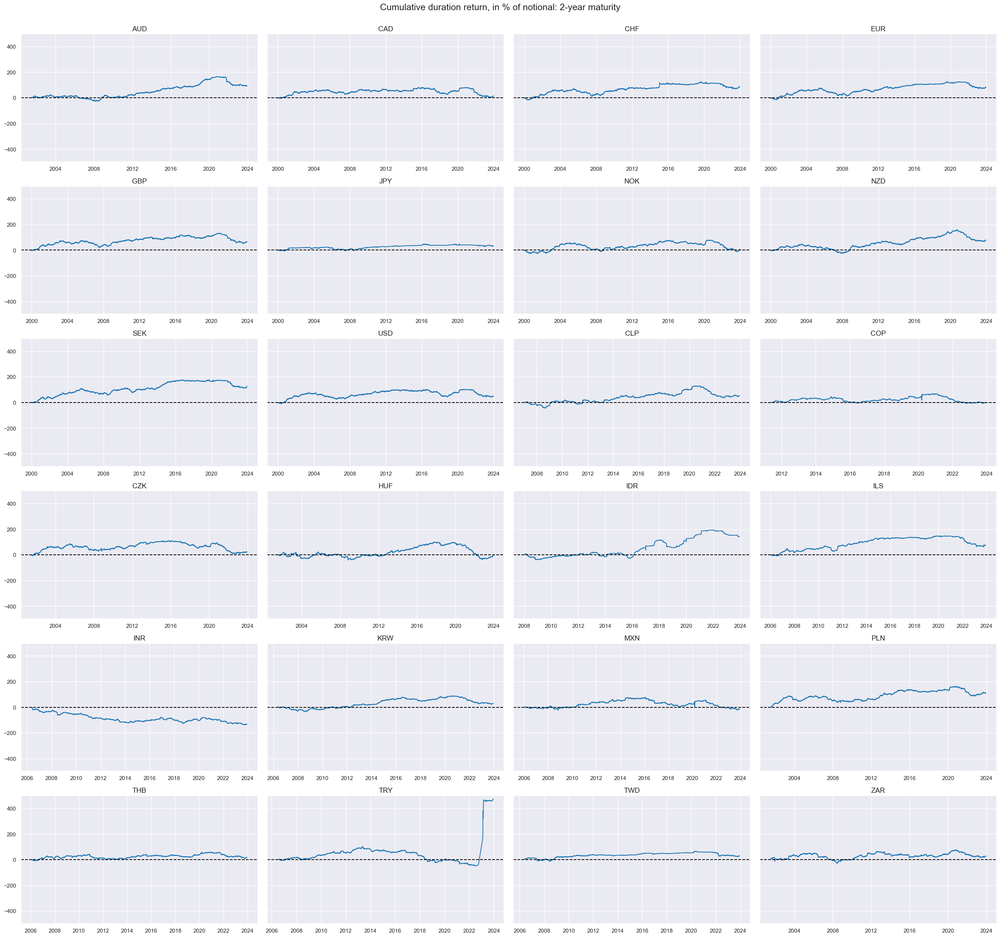

In [27]:
xcats_sel = ["DU02YXR_VT10"]
msp.view_timelines(
    df,
    xcats=xcats_sel,
    cids=cids_du,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    all_xticks=True,
    title="Cumulative duration return, in % of notional: 2-year maturity",
)

The correlation of returns across currency areas has been mostly positive. Note that for the purpose of correlation analysis of returns, it is preferable to use weekly rather than daily returns to mitigate time zone effects, the distortion of daily correlation due to different trading hours.

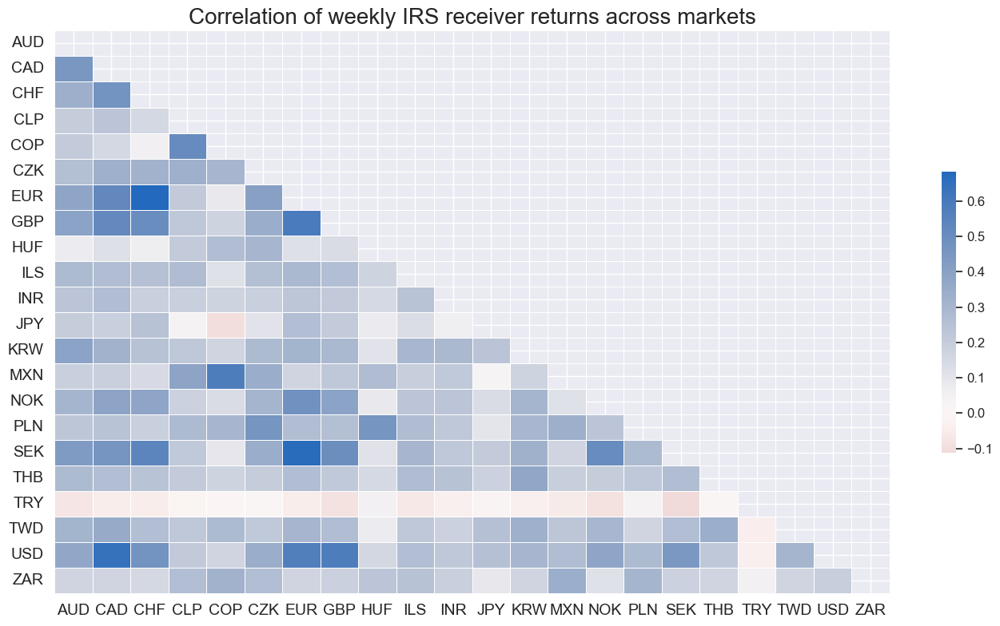

In [28]:
xcat = "DU02YXR_VT10"
dfxx = df[df["xcat"] == xcat].set_index("real_date")
dfxx = dfxx.groupby(["cid", "xcat"]).resample(rule="W-FRI")["value"].sum()
dfxx = dfxx.reset_index()

msp.correl_matrix(
    dfxx,
    xcats=xcat,
    cids=cids_dux,
    start="2000-01-01",
    title="Correlation of weekly IRS receiver returns across markets",
)

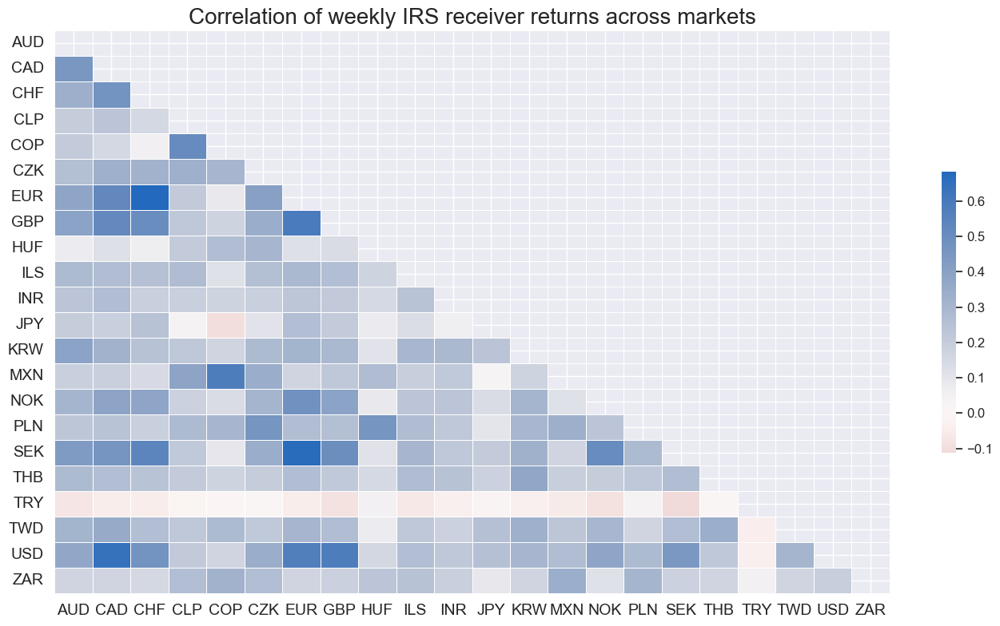

In [29]:
xcat = "DU02YXR_VT10"
dfxx = df[df["xcat"] == xcat].set_index("real_date")
dfxx = dfxx.groupby(["cid", "xcat"]).resample(rule="W-FRI")["value"].sum()
dfxx = dfxx.reset_index()

msp.correl_matrix(
    dfxx,
    xcats=xcat,
    cids=cids_dux,
    start="2000-01-01",
    title="Correlation of weekly IRS receiver returns across markets",
)

# 2.2.2. Relative fixed-receiver IRS returns versus G2

IRS returns relative to the G2 can be calculated in the same way as the relative excess macro trend using [`make_relative_value()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#compute-panels-versus-basket-with-make-relative-value) of the `macrosynergy.panel` module and [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df).

In [30]:
dfa = msp.make_relative_value(
    df,
    xcats=["DU02YXR_VT10", "DU05YXR_VT10"],
    cids=cids_dux,
    blacklist=fxblack,
    basket=["EUR", "USD"],
    rel_xcats=["DU02YXR_VT10vG2", "DU05YXR_VT10vG2"],
)
df = msm.update_df(df, dfa)

Naturally, both short- and medium-term dynamics of relative returns are notably different from absolute returns.

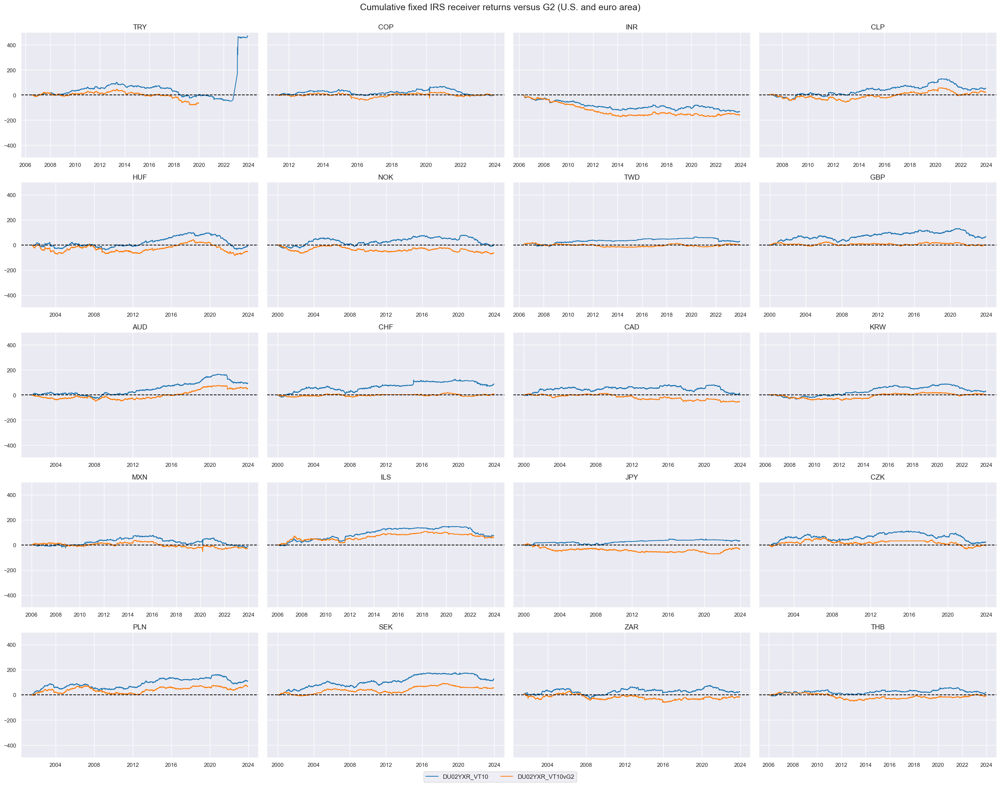

In [31]:
xcats_sel = ["DU02YXR_VT10", "DU02YXR_VT10vG2"]
cidx = cids_xg2

msp.view_timelines(
    df,
    xcats=xcats_sel,
    cids=cidx,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    all_xticks=True,
    title="Cumulative fixed IRS receiver returns versus G2 (U.S. and euro area)",
    xcat_labels=None,
)

Importantly, unlike excess macro trends, relative values of returns retain their dominant positive correlation. While some directional communality is removed by looking at returns relative to the G2, the communality of the relative benchmark is added.

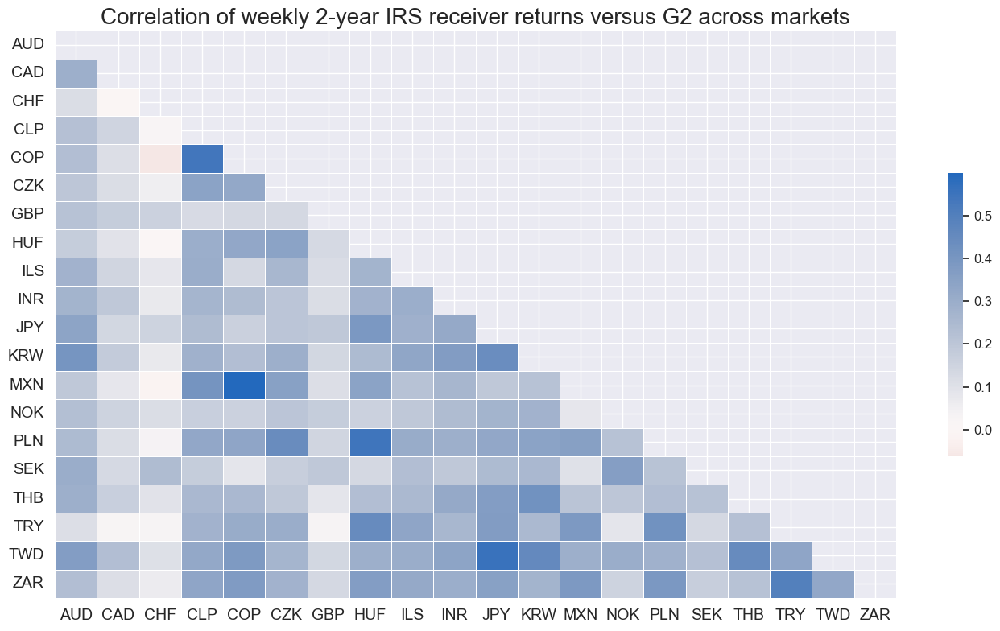

In [32]:
xcat = "DU02YXR_VT10vG2"
dfxx = df[df["xcat"] == xcat].set_index("real_date")
dfxx = dfxx.groupby(["cid", "xcat"]).resample(rule="W-FRI")["value"].sum()
dfxx = dfxx.reset_index()
msp.correl_matrix(
    dfxx,
    xcats=xcat,
    cids=cids_xg2,
    start="2000-01-01",
    title="Correlation of weekly 2-year IRS receiver returns versus G2 across markets",
)

# 2.2.3. Global relative fixed-receiver IRS returns

Again, relative returns to a global basket are calculated similarly to relative returns of excess macro trends to keep signals and target positions conceptually aligned. The same method is used here: first calculate new relative indicators using  [`make_relative_value()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#compute-panels-versus-basket-with-make-relative-value) of the `macrosynergy.panel` module and then add new indicators to the original dataframe using [`update_df()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#concatenate-dataframes-with-update-df) function in the `macrosynergy` management module.

In [33]:
dfa = msp.make_relative_value(
    df,
    xcats=["DU02YXR_VT10", "DU05YXR_VT10"],
    cids=cids_dux,
    blacklist=fxblack,
    rel_xcats=["DU02YXR_VT10vGLB", "DU05YXR_VT10vGLB"],
)
df = msm.update_df(df, dfa)

Returns relative to a global basket often show similar long-term patterns as returns relative to the G2, but very different short-term dynamics.

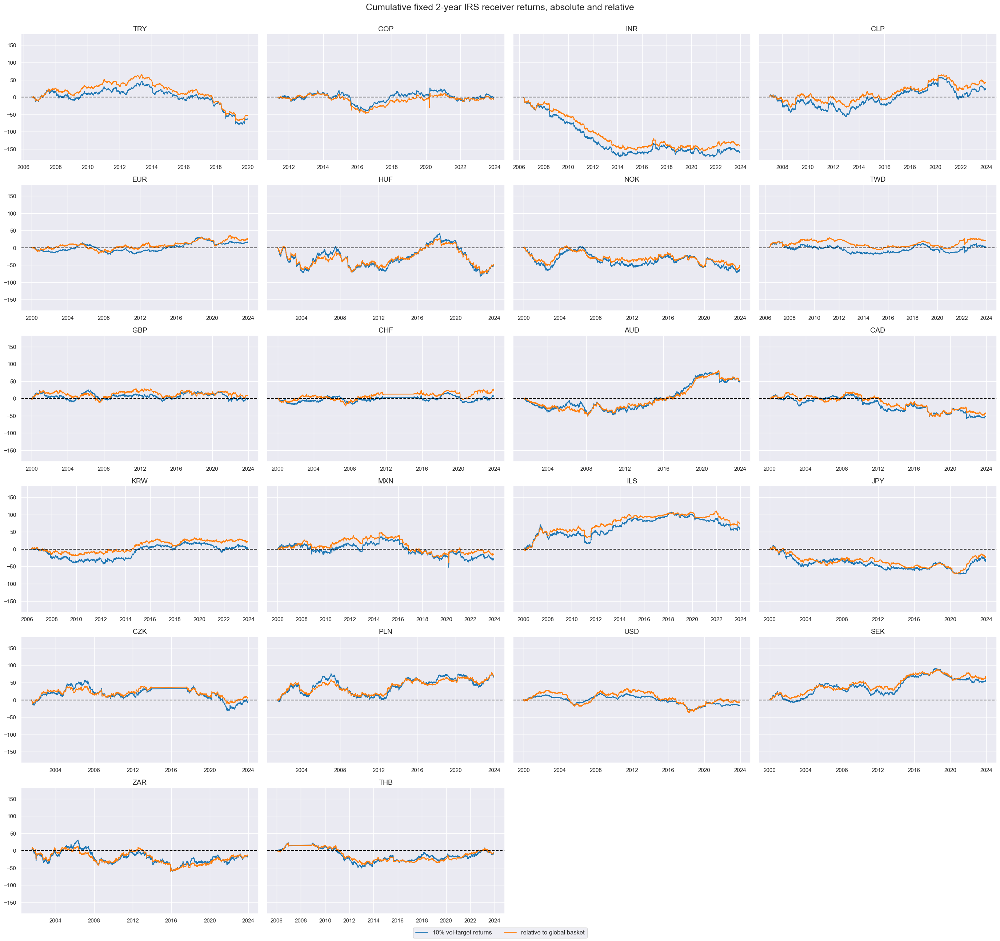

In [34]:
xcats_sel = ["DU02YXR_VT10vG2", "DU02YXR_VT10vGLB"]
msp.view_timelines(
    df,
    xcats=xcats_sel,
    cids=cids_dux,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    all_xticks=True,
    title="Cumulative fixed 2-year IRS receiver returns, absolute and relative",
    xcat_labels=["10% vol-target returns", "relative to global basket"],
)

The most important effect of using a broad basket as a benchmark for relative returns is that the dominant positive correlation is (naturally) removed. On the positive side, this means more idiosyncratic information can be brought to bear, and positions are more diversified. On the negative side, this means that leverage will be higher for a given volatility target of the strategy. 

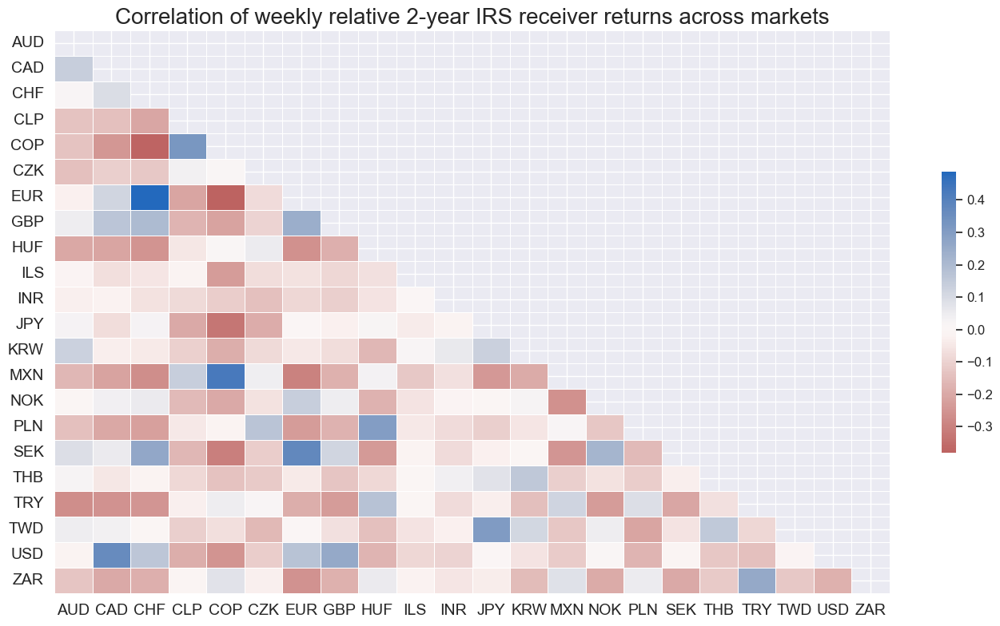

In [35]:
xcat = "DU02YXR_VT10vGLB"
dfxx = df[df["xcat"] == xcat].set_index("real_date")
dfxx = dfxx.groupby(["cid", "xcat"]).resample(rule="W-FRI")["value"].sum()
dfxx = dfxx.reset_index()
msp.correl_matrix(
    dfxx,
    xcats=xcat,
    cids=cids_dux,
    start="2000-01-01",
    title="Correlation of weekly relative 2-year IRS receiver returns across markets",
)

# 3. Value checks

In this part of the analysis, the notebook calculates the naive PnLs (Profit and Loss) for financial returns (duration returns in this notebook) using the previously derived composite indicators as well as their constituents. The PnLs are calculated based on simple trading strategies that utilize the indicators as signals (no regression is involved). The strategies involve going long (buying) or short (selling) on returns based purely on the direction of the score signals. The 4 simple macro strategies analyzed in this notebook are: 

- __G2 directional macro trend__:  analysis of predictive power of macro trend pressure on subsequent interest rate swap receiver returns (on vol-targeted positions) in the two large currency areas - USD and EUR
- __non-G2 directional macro trend__:  simple directional macro trend pressure and subsequent IRS receiver returns (on vol-targeted positions) in other currency areas 
- __non-G2 relative to G2 macro trend__: predictive power of macro trends of the smaller countries relative to the G2 on vol-targeted IRS returns relative to similar returns in the G2
- __global relative pressure factors__: checks the value of relative macro trends for each country versus an average of all other (available and tradable) countries on vol-targeted IRS returns relative to all available countries.

To evaluate the performance of these strategies, the notebook computes various metrics and ratios, including:

- Correlation: Measures the relationship between indicator changes and consequent financial returns. Positive correlations indicate that the strategy moves in the same direction as the market, while negative correlations indicate an opposite movement.

- Accuracy Metrics: These metrics assess the accuracy of the confidence score-based strategies in predicting market movements. Standard accuracy metrics include accuracy rate, balanced accuracy, precision, etc.

- Performance Ratios: Various performance ratios, such as Sharpe ratio, Sortino ratio, Max draws, etc.

The notebook compares the performance of the simple strategies with the long-only performance of the respective asset classes. 

It's important to note that the analysis deliberately disregards transaction costs and risk management considerations. This is done to provide a more straightforward comparison of the strategies' raw performance without the additional complexity introduced by transaction costs and risk management, which can vary based on trading size, institutional rules, and regulations.

# 3.1. G2 directional macro trends

In this section, we concentrate exclusively on the G2 currencies, specifically the USD and EUR markets. This focus is justified by the significant influence these markets exert on smaller ones, a dominance not reciprocated by smaller markets in relation to the G2.

To enable consistent and efficient analysis across various hypotheses, we have developed a custom dictionary, named `dict_direct_g2`, tailored for this first hypothesis. This dictionary is designed with specific keys to streamline data handling and analysis:

- `sigs`: A list of selected, plausible trading signals for comparative analysis. For this hypothesis, the list includes two composite macro pressure indicators previously calculated in the notebook, alongside their components: ["XGHIPC", "XGHI", "INTRGDPv5Y_NSA_P1M1ML12_3MMA", "CPIH_SA_PALLvIET", "CPIC_SA_PALLvIET", "PCREDITBN_SJA_P1M1ML12vLTB"]
- `targs`: Targets are selected based on specific returns we aim to outperform using the signals: the 2-year and 5-year IRS vol targeted fixed receiver returns, denoted as ["DU02YXR_VT10", "DU05YXR_VT10"].
- `cids`: This key identifies the cross-sections for the analysis, in this case, the G2 currencies  ["EUR", "USD"]
- `start`:  The start date for the data period under analysis, set to "2000-01-01".
- `cr`: short for "Category Relations": class from the `macrosynnergy.panel` package, designed to organize panels of signals and targets into formats suitable for analysis. This key will be populated post-calculations.
- `freqs`: A list of frequencies, including M for monthly and Q for quarterly.
- `srr`: Short for "Signal Returns Relations," this key is used to compute the relationships between panels of the selected trading signals (`sigs`) and the panels of subsequent returns from the list (`targs`). This key will be populated post-calculations.
- `pnls`: This key will later contain the time series of naive trading Profit and Loss (PnL), calculated by using each signal from the  `sigs` list as the trading signal for the corresponding return from the `targs` list.

These elements are structured to facilitate an organized approach to the analysis, allowing for straightforward comparisons and replication of outcome evaluations across different trading strategies and hypotheses.


#### Specs and correlation

We start by defining a dictionary with the key parameters necessary for evaluating a specific type of strategy. This includes setting the signals, target returns, cross-sections, initial date, and analysis frequencies for evaluating a directional IRS strategy for the U.S. and the Euro area (G2). Additionally, to facilitate easier interpretation, we define a dictionary of labels where the keys are the technical names of the indicators and the values provide their explanations.

In [36]:
direct_g2_labels = {
    "XGHIPC": "Broad macro trend pressure",
    "XGHI": "Growth and inflation trend pressure",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA": "Excess real GDP growth trend",
    "CPIH_SA_PALLvIET": "Excess CPI inflation trend",
    "PCREDITBN_SJA_P1M1ML12vLTB": "Excess private credit growth trend",
    "DU02YXR_VT10": "2-year IRS receiver, vol targeted",
    "DU05YXR_VT10": "5-year IRS receiver, vol targeted"
}

dict_direct_g2 = {
    "sigs": [key for key in direct_g2_labels.keys()][:5],
    "targs": ["DU02YXR_VT10", "DU05YXR_VT10"],
    "cids": ["EUR", "USD"],
    "start": "2000-01-01",
    "freqs": ["M", "Q"],
    "cr": None,
    "srr": None,
    "pnls": None,
}


Instances of the [`CategoryRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#investigate-relations-between-panels-with-categoryrelations) class from the `macrosynnergy.panel` package are designed to organize panels of features and targets into formats suitable for analysis. This class provides functionalities for frequency conversion, adding lags, and trimming outliers. The outcome of the CategoryRelations calculation is subsequently added to the custom dictionary `dict_direct_g2` under the key `cr`.

Economic theory suggests that in markets lacking full informational efficiency, the relationship between excess macroeconomic trends and IRS (Interest Rate Swap) returns should be negative. This is because positive excesses tend to bias monetary policy towards tightening, which typically results in higher interest rates.

This hypothesis has been supported by data from the G2 economies, where a significantly negative correlation has been observed since the year 2000. Below, we present a side-by-side comparison of the simple macro pressure indicator against subsequent IRS returns and its components to illustrate this point.

In [37]:
dix = dict_direct_g2

sigx = dix["sigs"]  # List of signal names
targx = dix["targs"][0]  # Assuming only one target for simplicity, "DU02YXR_VT10", 2-year IRS receiver, vol targeted
cidx = dix["cids"]  # cids selection
start = dix["start"] # start date of analysis

cr_directg2 = {}

for sig in sigx:
    cr_directg2[f"cr_{sig}"] = msp.CategoryRelations(
        df,
        xcats=[sig, targx],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        blacklist=fxblack,
        start=start,
        xcat_trims=[None, None]
    )

dix["cr"] = cr_directg2

`multiple_reg_scatter()` method allows comparison of several pairs of two categories relationships side by side, including the strength of the linear association and any potential outliers. By default, it includes a regression line with a 95% confidence interval, which can help assess the significance of the relationship. 

The `prob_est` argument in this context is used to specify which type of estimator to use for calculating the probability of a significant relationship between the feature category and the target category.`prob_est` is `"map"`, which stands for "Macrosynergy panel test". Often, cross-sectional experiences are not independent and subject to common factors. Simply stacking data can lead to “pseudo-replication” and overestimated significance of correlation. A better method is to check significance through panel regression models with period-specific random effects. This technique adjusts targets and features of the predictive regression for common (global) influences. The stronger these global effects, the greater the weight of deviations from the period-mean in the regression. In the presence of dominant global effects, the test for the significance of a feature would rely mainly upon its ability to explain cross-sectional target differences. Conveniently, the method automatically accounts for the similarity of experiences across sections when assessing the significance and, hence, can be applied to a wide variety of features and targets. View a related research post [here](https://research.macrosynergy.com/testing-macro-trading-factors) that provides more information on this approach.

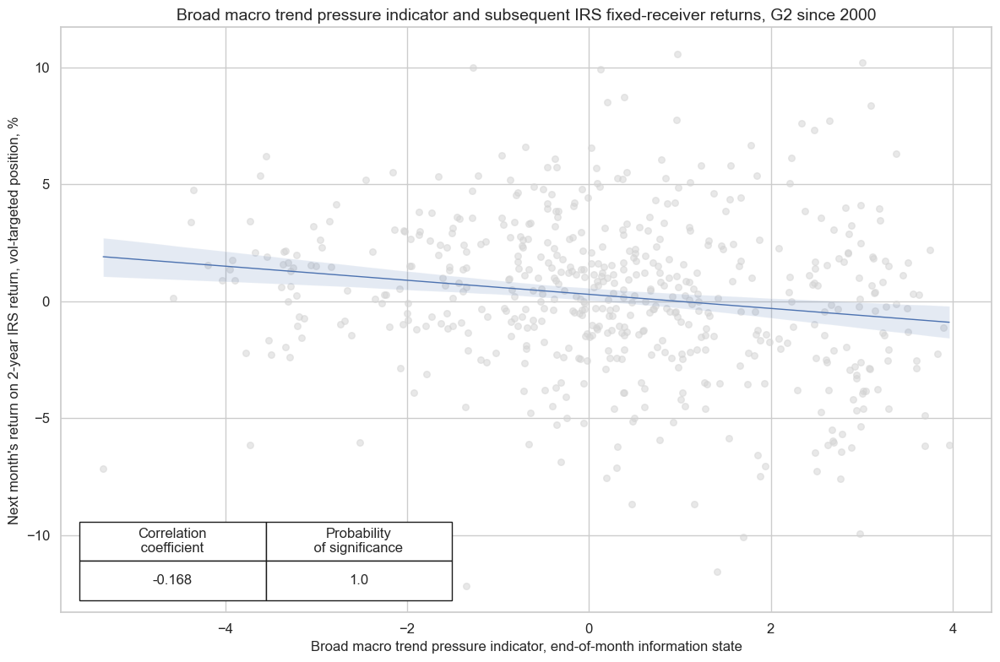

In [38]:
dix = dict_direct_g2
cr = dix["cr"]

cr["cr_XGHIPC"].reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Broad macro trend pressure indicator and subsequent IRS fixed-receiver returns, G2 since 2000",
    xlab="Broad macro trend pressure indicator, end-of-month information state",
    ylab="Next month's return on 2-year IRS return, vol-targeted position, %",
)

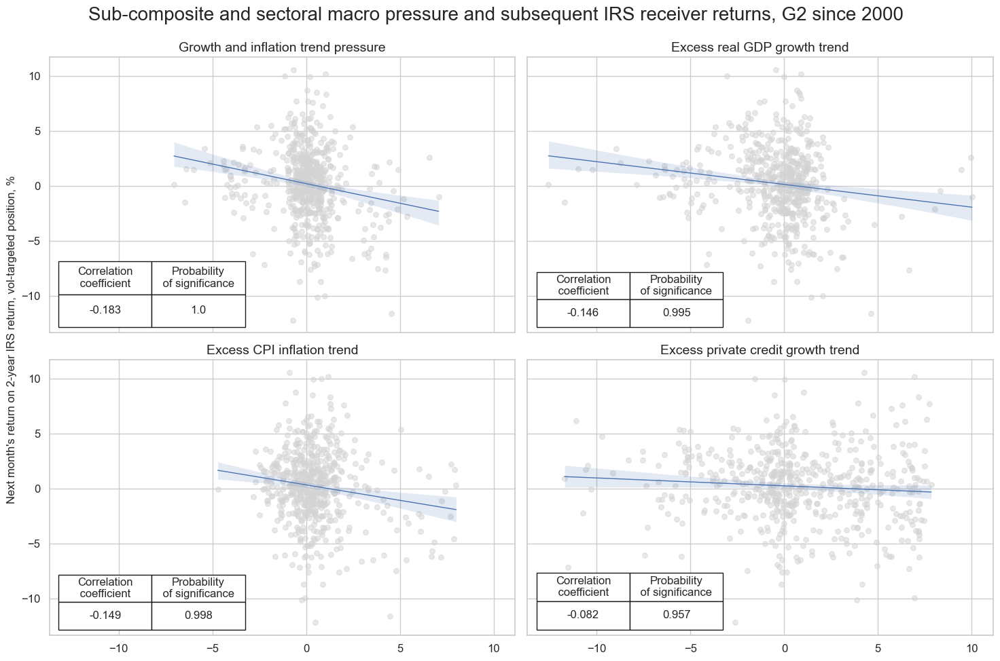

In [39]:
dix = dict_direct_g2
cr = dix["cr"]


msv.multiple_reg_scatter(
    cat_rels = [cr["cr_"+ key] for key in list(direct_g2_labels.keys())[1:5]],
    title="Sub-composite and sectoral macro pressure and subsequent IRS receiver returns, G2 since 2000",
    ylab="Next month's return on 2-year IRS return, vol-targeted position, %",
    ncol=2,
    nrow=2,
    figsize=(15, 10),
    prob_est="map",
    coef_box="lower left",
    subplot_titles=[lab for lab in list(direct_g2_labels.values())[1:5]],
)

In order to assert the stability of the relation, it can be helpful to check the correlation for different time periods and for the available cross sections.

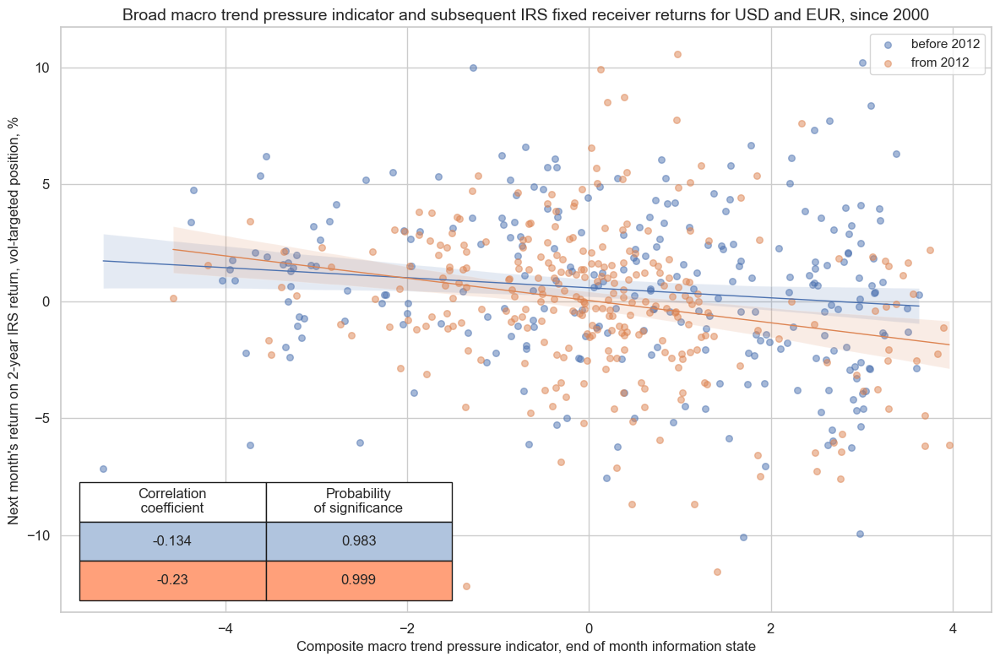

In [40]:
dix = dict_direct_g2
cr = dix["cr"]

cr["cr_XGHIPC"].reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Broad macro trend pressure indicator and subsequent IRS fixed receiver returns for USD and EUR, since 2000",
    xlab="Composite macro trend pressure indicator, end of month information state",
    ylab="Next month's return on 2-year IRS return, vol-targeted position, %",
    separator=2012,
    prob_est="map",
)

Alternatively, the relationship can be viewed separately for each cross-section using `separator="cids"` option:

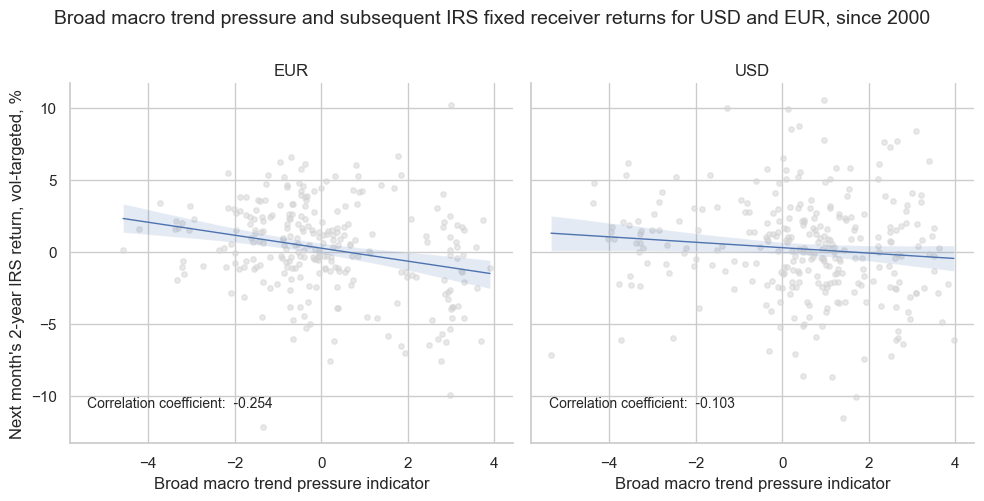

In [41]:
dix = dict_direct_g2
cr = dix["cr"]


cr["cr_XGHIPC"].reg_scatter(
    labels=False,
    coef_box="upper left",
    ncol=2,
    title="Broad macro trend pressure and subsequent IRS fixed receiver returns for USD and EUR, since 2000",
    xlab="Broad macro trend pressure indicator",
    ylab="Next month's 2-year IRS return, vol-targeted, %",
    separator="cids",
    size=(5, 5),
    
)

There is also a method to view the relation between the (lagged) predictive feature and the target return in a more traditional regression evaluation table. A general overview of the interpretation can be found [here](https://medium.com/swlh/interpreting-linear-regression-through-statsmodels-summary-4796d359035a)

In [42]:
dix = dict_direct_g2
cr = dix["cr"]

cr["cr_XGHIPC"].ols_table()

                            OLS Regression Results                            
Dep. Variable:           DU02YXR_VT10   R-squared:                       0.028
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     15.92
Date:                Sat, 05 Apr 2025   Prob (F-statistic):           7.52e-05
Time:                        10:37:25   Log-Likelihood:                -1434.6
No. Observations:                 550   AIC:                             2873.
Df Residuals:                     548   BIC:                             2882.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2919      0.142      2.059      0.0

#### Accuracy and correlation check

The [`SignalReturnRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#signalreturnrelations) class of the `macrosynergy.signal` module collects the main positioning factor and its key rivals (or constituents), and brings them into the right format by appropriate frequency conversion (which should correspond to the envisaged trading frequency) and whether the signal is supposed to predict the return positively or negatively. The result of the SignalReturnRelations calculation is then added to the custom dictionary `dict_direct_g2` under the key `srr`

In [43]:
dix = dict_direct_g2

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cids"]
start = dix["start"]
freqs = dix["freqs"]

srr = mss.SignalReturnRelations(
    df,
    cids=cidx,
    sigs=sigx,
    blacklist=fxblack,
    sig_neg=[True] * len(sigx),
    rets=targx,
    freqs=freqs,
    start=start,
)

dix["srr"] = srr

The `multiple_relations_table()` method, part of the `SignalReturnRelations` class within the `macrosynergy.signal` module, facilitates the comparison of multiple signal-return relationships within a single table. This method is particularly useful for evaluating the efficacy of various signals against identical return series across potentially different financial returns and frequencies. The table is structured such that the first column displays the target (financial return), and the second column shows the name of the signal, with `_NEG` appended to indicate a negative relationship to the named return. The table also includes standard columns that conform to established metrics such as accuracy, balanced accuracy, and others, which are detailed in  [MacroSynergy's documentation on summary tables](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#summary-tables). This structured approach allows for an intuitive and comprehensive assessment of signal performance in relation to various financial returns.


In [44]:
dix = dict_direct_g2

srrx = dix["srr"]
freqs = dix["freqs"]
targx = dix["targs"]

# Table with renamed rows
dict_repl = dict(
    zip(
        [key + "_NEG" for key in direct_g2_labels.keys()],
        [val + " (neg)" for val in direct_g2_labels.values()],
    )
)
tbxx = (
    srrx.multiple_relations_table(signal_name_dict=dict_repl, freqs=freqs)
    .reset_index(level=["Aggregation"], drop=True)
    .reset_index()
)

# for column modifications
dict_cols = {
    "Signal" : "Signal",
    "Frequency": "Frequency",
    "accuracy": "Accuracy",
    "bal_accuracy": "Balanced accuracy",
    "pos_sigr": "Share of positive signals",
    "pos_retr": "Share of positive returns",
    "pearson": "Pearson coefficient",
    "kendall": "Kendall coefficient",
}

for xr in targx:

    tbx_xr = tbxx.loc[tbxx.Return == xr, list(dict_cols.keys())]
    tbx_xr.rename(columns=dict_cols, inplace=True)
 
    # Preserve the order of appearance for 'Signal'
    signals_order = tbx_xr['Signal'].unique()

    # Create a new DataFrame for sorted results
    sorted_dfs = []
    for signal in signals_order:
        # Filter data for current signal
        group = tbx_xr[tbx_xr['Signal'] == signal]

        # Sort 'Frequency' within the current 'Signal'
        sorted_group = group.sort_values(by='Frequency')
        
        # Append sorted group to list
        sorted_dfs.append(sorted_group)

    # Concatenate all sorted groups into one DataFrame
    tbx_xr = pd.concat(sorted_dfs)

    # Set the multi-index after sorting
    tbx_xr.set_index(["Signal", "Frequency"], inplace=True)


# apply style and heading

    tbx_xr = tbx_xr.style.format("{:.2f}").set_caption(
        f"Predictive accuracy and correlation with respect to {direct_g2_labels[xr]} returns").set_table_styles(
        [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}])

    display(tbx_xr)

The `type="summary"` option within `.single_relation_table()` yields a table with more detailed breakdown for a particular signal 

In [45]:
dix = dict_direct_g2

srrx = dix["srr"]

dict_cols = {
    "accuracy": "Accuracy",
    "bal_accuracy": "Balanced accuracy",
    "pos_sigr": "Share of positive signals",
    "pos_retr": "Share of positive returns",
    "pearson": "Pearson coefficient",
    "kendall": "Kendall coefficient",
}


tbxx= srrx.single_relation_table(
    ret="DU02YXR_VT10", 
    xcat="XGHIPC_NEG", 
    freq="M",
    table_type="years")

tbx_xr = tbxx.loc[:, list(dict_cols.keys())]
tbx_xr.rename(columns=dict_cols, inplace=True)

# apply style and heading

tbx_xr = tbx_xr.style.format("{:.2f}").set_caption(
    f"Predictive accuracy and correlation of broad macro pressure signal with respect to vol-targeted 2-year IRS returns"
).set_table_styles([
    {"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
])
display(tbx_xr)

,Accuracy,Balanced accuracy,Share of positive signals,Share of positive returns,Pearson coefficient,Kendall coefficient
M: XGHIPC_NEG/last => DU02YXR_VT10,0.56,0.57,0.43,0.54,0.17,0.13
Mean,0.56,0.54,0.42,0.55,0.01,0.03
PosRatio,0.62,0.62,0.33,0.58,0.58,0.58
2000,0.27,0.27,0.00,0.73,-0.60,-0.35
2001,0.50,0.50,0.50,0.67,-0.19,-0.12
2002,0.78,0.67,0.83,0.78,-0.00,-0.02
2003,0.50,0.50,0.58,0.50,0.09,0.04
2004,0.50,0.54,0.21,0.54,0.24,0.18
2005,0.58,0.58,0.00,0.42,0.26,0.17
2006,0.62,0.62,0.00,0.38,-0.19,-0.13


The `single_statistic_table()` method generates a table and heatmap featuring a singular statistic for each signal-return correlation. The heatmap, where darker (blue) shades indicate higher (positive) values, allows to visually compare the statistics across different signals for all frequencies (as indicated after the `\` following the return's name).

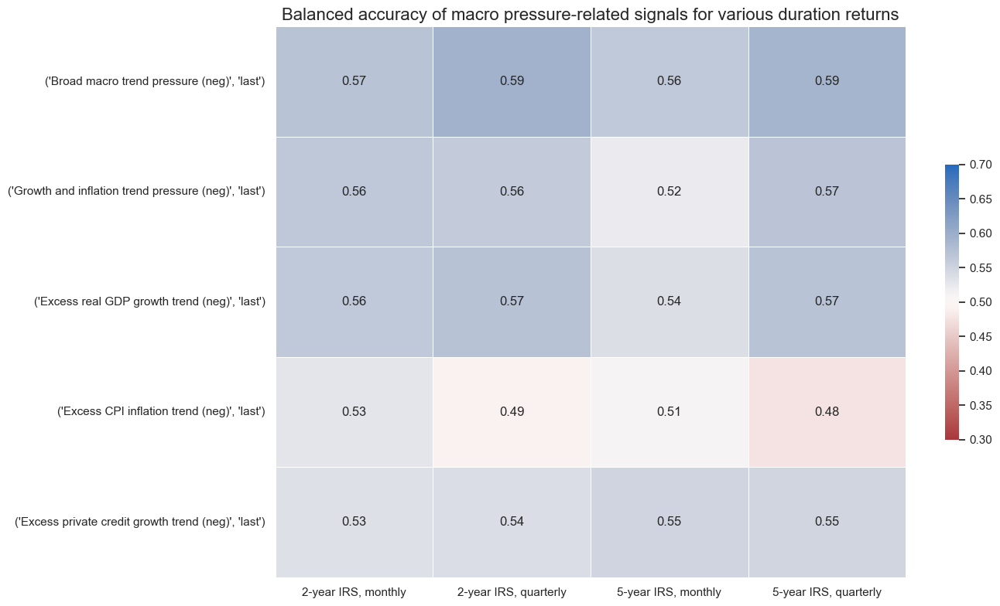

In [46]:
dix = dict_direct_g2
srrx = dix["srr"]
dict_repl = dict(zip([key + "_NEG" for key in direct_g2_labels.keys()], [val + " (neg)" for val in direct_g2_labels.values()]))


tbxx = srrx.single_statistic_table(
    stat="bal_accuracy",
    show_heatmap=True,
    signal_name_dict=dict_repl,
    column_names=["2-year IRS, monthly", "2-year IRS, quarterly", "5-year IRS, monthly", "5-year IRS, quarterly"],
    title="Balanced accuracy of macro pressure-related signals for various duration returns",
    min_color=0.3,
    max_color=0.7,
    title_fontsize=16,
    round=2,
)

tbx_xr = tbxx.style.format("{:.2f}").set_caption(
    f"Balanced accuracy of macro pressure signals for duration returns"
).set_table_styles([
    {"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
])
display(tbx_xr)

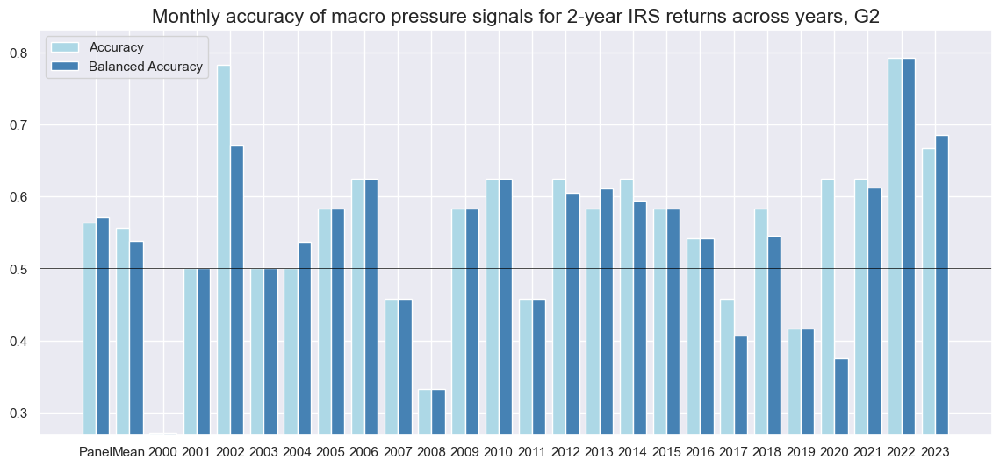

In [47]:
dix = dict_direct_g2
srrx = dix["srr"]

srrx.accuracy_bars(
    sigs = "XGHIPC_NEG",
    ret = "DU02YXR_VT10",
    freq = "M",
    type="years",
    title="Monthly accuracy of macro pressure signals for 2-year IRS returns across years, G2",
    size=(14, 6),
)

#### PnLs

The [`NaivePnL`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#naivepnl) class of the `macrosynergy.pnl` module is the basis for calculating simple stylized PnLs for various signals under consideration of correlation benchmarks.

The related [`make_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-pnl) method calculates and stores generic PnLs based on a range of signals and their transformations into positions. The positioning options include the choice of trading frequency, z-scoring, simple equal-size long-short positions (-1/1) thresholds to prevent outsized positions, and rebalancing slippage.
The generated PnLs are, however, naive insofar as they do not consider trading costs and plausible risk management restrictions. Also, if a volatility scale is set, this is done so ex-post, mainly for the benefit of plotting different signals' PnLs in a single chart.

A complementary method is [`make_long_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-long-pnl), which calculates a "long-only" PnL based on a uniform long position across all markets at all times. This often serves as a benchmark for gauging the benefits of active trading.

In [48]:
dix = dict_direct_g2

sigx = dix["sigs"]
targx = dix["targs"][0]
cidx = dix["cids"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    df,
    ret=targx,
    sigs=sigx,
    blacklist=fxblack,
    cids=cidx,
    start=start,
  #  bms=["USD_GB10YXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long")

dix["pnls"] = naive_pnl

Simple cumulative PnLs in the class instance can be plotted with the [`plot_pnls()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#plot-pnls) method. They mainly inform on seasonality and stability of value generation under the assumption of negligible transaction costs.

The below chart illustrates that the PnL generation of macro trend pressure has been strongest in the 2000s and 2020s and was very faint in the 2010s, illustrating the seasonality of a single-principle strategy in a small set of markets. Short-term interest rates near the zero boundary were the plausible cause of low-value generation in the G2 in the 2010s.

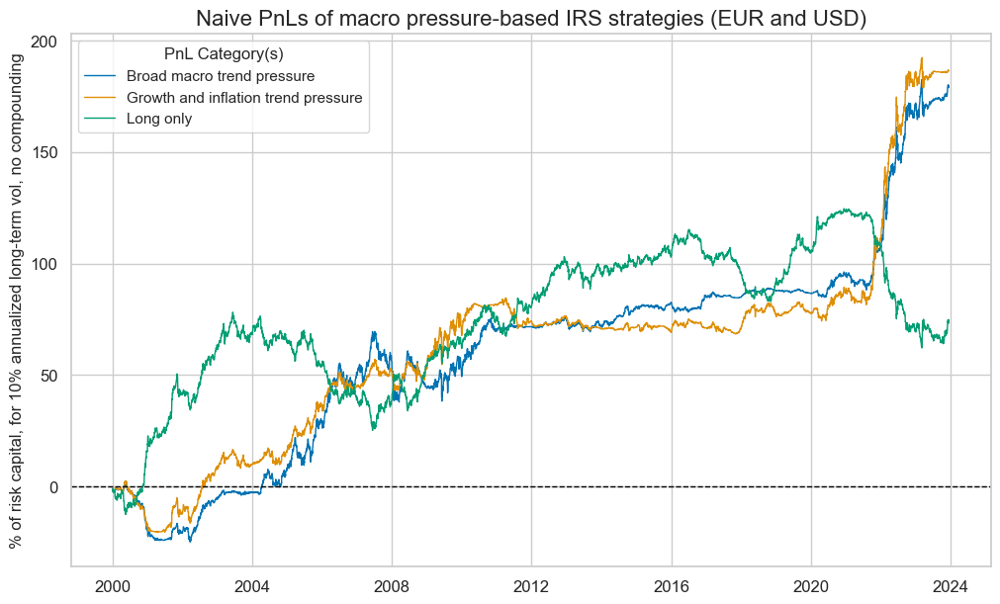

In [49]:
dix = dict_direct_g2

start = dix["start"]
cidx = dix["cids"]
sigx = dix["sigs"]
pnlx = dix["pnls"]

pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long"]

pnl_directg2={key + "_PZN": value for key, value in direct_g2_labels.items()}
pnl_direct_g2_labels = {key: pnl_directg2[key] for key in list(pnl_directg2)[:2]}
pnl_direct_g2_labels["Long"] = "Long only"


pnlx.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Naive PnLs of macro pressure-based IRS strategies (EUR and USD)",
    title_fontsize=16,
    xcat_labels=pnl_direct_g2_labels,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    start=start,
)

The [`evaluate_pnls()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#evaluate-pnls) method displays a few characteristic performance metrics of selected signals' naive PnLs. They illustrate that macro trend pressure-based portfolios generated much higher Sharpe ratios than the long-only portfolio with zero to negative correlation to duration return benchmarks.

In [50]:
dix = dict_direct_g2

start = dix["start"]
cidx = dix["cids"]
pnlx = dix["pnls"]
sigx = dix["sigs"]
pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long"]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    )

df_eval = df_eval.rename(columns=pnl_direct_g2_labels)

# apply style and heading

df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics of macro pressure-based IRS strategies (EUR and USD)"
    ).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
    ])

display(df_eval)


xcat,Broad macro trend pressure,Growth and inflation trend pressure,Long only
Return %,7.53,7.81,3.13
St. Dev. %,10.00,10.00,10.00
Sharpe Ratio,0.75,0.78,0.31
Sortino Ratio,1.08,1.12,0.45
Max 21-Day Draw %,-19.87,-13.58,-13.76
Max 6-Month Draw %,-24.52,-17.64,-34.11
Peak to Trough Draw %,-31.63,-23.21,-62.47
Top 5% Monthly PnL Share,0.77,0.74,1.45
Traded Months,288.00,288.00,288.00


The method `create_results_dataframe()` from macrosynergy.pnl displays a small dataframe of key statistics for all signals:

In [51]:
dix = dict_direct_g2
sigx = dix["sigs"]
cidx = dix["cids"]
freqs = dix["freqs"]

for fr in freqs:

  results = msn.create_results_dataframe(
    title=f"Performance metrics of macro pressure signals based strategies, {fr} frequency, for vol targeted 2-year IRS returns",
    df=df,
    ret="DU02YXR_VT10",
    sigs=sigx,
    cids=cidx,
    sig_ops="zn_score_pan",
    sig_adds=0,
    sig_negs=[True] * len(sigx),
    neutrals="zero",
    threshs=2,
 #   bm="USD_GB10YXR_NSA",
  #  cosp=True,
    start=start,
    blacklist=fxblack,
    freqs=fr,
    agg_sigs="last",
    slip=1,
  )
  display(results)


,Accuracy,Bal. Accuracy,Pearson,Kendall,Sharpe,Sortino
CPIH_SA_PALLvIET_NEG,0.504,0.514,0.145,0.048,0.341,0.477
INTRGDPv5Y_NSA_P1M1ML12_3MMA_NEG,0.566,0.569,0.140,0.112,0.886,1.312
PCREDITBN_SJA_P1M1ML12vLTB_NEG,0.533,0.538,0.080,0.075,0.387,0.547
XGHI_NEG,0.562,0.567,0.177,0.121,0.781,1.122
XGHIPC_NEG,0.562,0.570,0.163,0.128,0.753,1.079


,Accuracy,Bal. Accuracy,Pearson,Kendall,Sharpe,Sortino
CPIH_SA_PALLvIET_NEG,0.489,0.498,0.201,0.069,0.341,0.477
INTRGDPv5Y_NSA_P1M1ML12_3MMA_NEG,0.589,0.592,0.203,0.156,0.886,1.312
PCREDITBN_SJA_P1M1ML12vLTB_NEG,0.533,0.537,0.125,0.100,0.387,0.547
XGHI_NEG,0.555,0.559,0.249,0.147,0.781,1.122
XGHIPC_NEG,0.582,0.590,0.239,0.169,0.753,1.079


The `signal_heatmap()` method visualizes the long-short positioning in fixed receivers across markets and time. It illustrates that signal strength has been strongest before and after major crisis events.

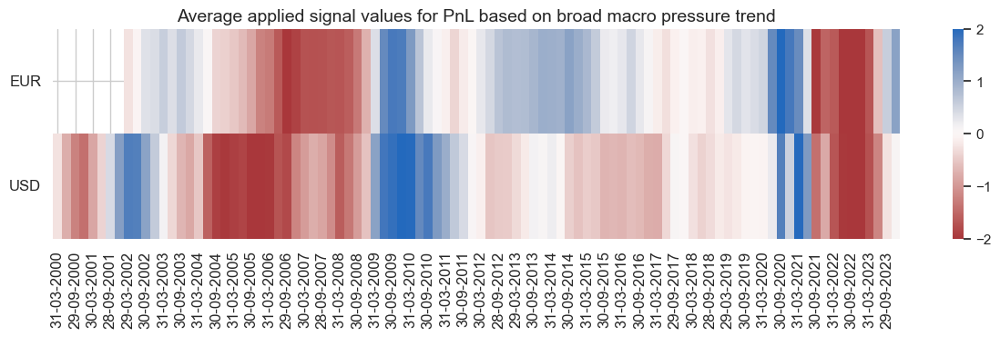

In [52]:
dix = dict_direct_g2
pnlx = dix["pnls"]

pnlx.signal_heatmap(pnl_name="XGHIPC_PZN", 
                    freq="q", 
                    title="Average applied signal values for PnL based on broad macro pressure trend",  
                    figsize=(15, 3))

# 3.2. Non-G2 directional macro trends

Directional excess macro trends for small countries as trading signal plausibly consider partly also the excess trends in the G2 "influencer" countries. The below section considers these combined trends as well as the idiosyncratic trends alone.

To enable consistent and efficient analysis across various hypotheses, we have developed a custom dictionary, named `dict_direct_oth`, tailored for the second hypothesis. This dictionary is designed with specific keys to streamline data handling and analysis:

- `sigs`: A list of selected, plausible trading signals for comparative analysis ["XGHIPC_SCH", "XGHI_SCH", "XGHIPC", "XGHI"].
- `targs`:  Targets are selected based on specific returns we aim to outperform using the signals: the 2-year and 5-year IRS vol targeted fixed receiver returns, denoted as ["DU02YXR_VT10", "DU05YXR_VT10"].
- `cids`: A list identifying different cross-sections for detailed analysis `cids_xg2` - a list of all available currencies, excluding USD and EUR.
- `start`:  The start date for the data period under analysis, set to "2000-01-01".
- `cr`: short for "Category Relations": class from the `macrosynnergy.panel` package, designed to organize panels of signals and targets into formats suitable for analysis. This key will be populated post-calculations.
- `freqs`: A list of frequencies, including M for monthly and Q for quarterly.
- `srr`: Short for "Signal Returns Relations," this key is used to compute the relationships between panels of the selected trading signals (`sigs`) and the panels of subsequent returns from the list (`targs`). This key will be populated post-calculations.
- `pnls`: This key will later contain the time series of naive trading Profit and Loss (PnL), calculated by using each signal from the  `sigs` list as the trading signal for the corresponding return from the `targs` list.

#### Specs and correlation

Similar to the G2 strategy above, we start by defining a dictionary with the key parameters necessary for evaluating a non-G2 directional macro trends strategy. This includes setting the signals, target returns, cross-sections, initial date, and analysis frequencies for evaluating a directional IRS strategy for smaller currencies. Additionally, to facilitate easier interpretation, we define a dictionary of labels where the keys are the technical names of the indicators and the values provide their explanations.

In [53]:
direct_oth_labels = {
    "XGHIPC_SCH": "Hybrid broad macro trend pressure",
    "XGHI_SCH": "Hybrid narrow macro trend pressure",
    "XGHIPC": "Country broad macro trend pressure",
    "XGHI": "Country narrow macro trend pressure",
    "DU02YXR_VT10": "2-year IRS receiver, vol targeted",
    "DU05YXR_VT10": "5-year IRS receiver, vol targeted"
}

dict_direct_oth = {
    "sigs": [key for key in direct_oth_labels.keys()][:4],
    "targs": ["DU02YXR_VT10", "DU05YXR_VT10"],
    "cids": cids_xg2,
    "start": "2002-01-01",
    "freqs": ["M", "Q"],
    "cr": None,
    "srr": None,
    "pnls": None,
}

The correlation between composite excess macro trends and subsequent IRS receiver returns has been significantly negative since 2002 on monthly basis.

The negative correlation would have been even stronger and clearer on quarterly basis, which is not unusual for macroeconomic factors and suggests that related strategies can get away with low-frequency trading and low transaction costs.

Instances of the [`CategoryRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#investigate-relations-between-panels-with-categoryrelations) class from the `macrosynnergy.panel` package are designed to organize panels of features and targets into formats suitable for analysis. This class provides functionalities for frequency conversion, adding lags, and trimming outliers. The outcome of the CategoryRelations calculation is subsequently added to the custom dictionary `dict_direct_oth` under the key `cr`.

In [54]:
dix = dict_direct_oth

sigx = dix["sigs"]  # List of signal names
targx = dix["targs"][0]  # Assuming only one target for simplicity
cidx = dix["cids"]  # cids selection
start = dix["start"]

cr_direct_oth = {}

for sig in sigx:
    cr_direct_oth[f"cr_{sig}"] = msp.CategoryRelations(
        df,
        xcats=[sig, targx],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        blacklist=fxblack,
        start=start,
        xcat_trims=[None, None]
    )

dix["cr"] = cr_direct_oth

`multiple_reg_scatter()` method allows comparison of several pairs of two categories relationships side by side, including the strength of the linear association and any potential outliers. By default, it includes a regression line with a 95% confidence interval, which can help assess the significance of the relationship. 

The `prob_est` argument in this context is used to specify which type of estimator to use for calculating the probability of a significant relationship between the feature category and the target category.`prob_est` is `"map"`, which stands for "Macrosynergy panel test". Often, cross-sectional experiences are not independent and subject to common factors. Simply stacking data can lead to “pseudo-replication” and overestimated significance of correlation. A better method is to check significance through panel regression models with period-specific random effects. This technique adjusts targets and features of the predictive regression for common (global) influences. The stronger these global effects, the greater the weight of deviations from the period-mean in the regression. In the presence of dominant global effects, the test for the significance of a feature would rely mainly upon its ability to explain cross-sectional target differences. Conveniently, the method automatically accounts for the similarity of experiences across sections when assessing the significance and, hence, can be applied to a wide variety of features and targets. View a related research post [here](https://research.macrosynergy.com/testing-macro-trading-factors) that provides more information on this approach.

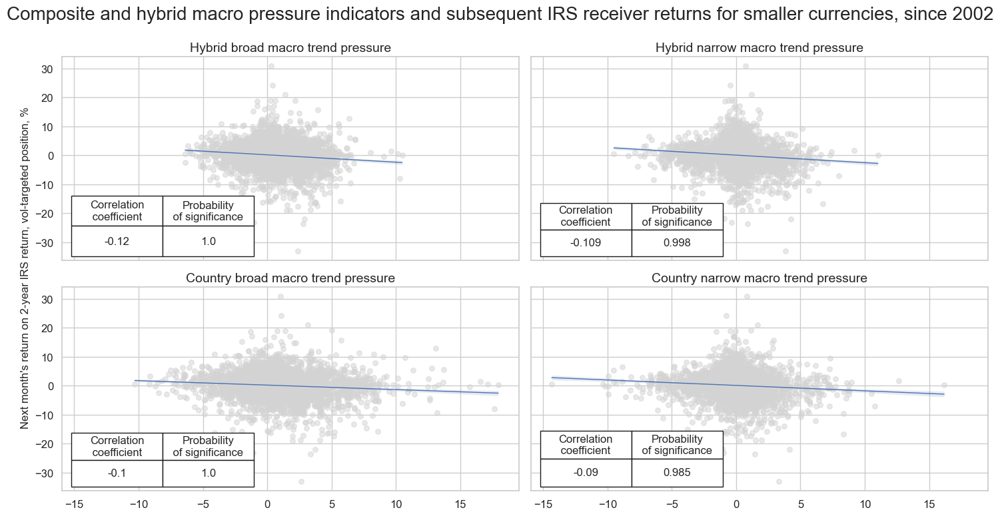

In [55]:
dix = dict_direct_oth
cr = dix["cr"]

msv.multiple_reg_scatter(
        [cr["cr_XGHIPC_SCH"], cr["cr_XGHI_SCH"], cr["cr_XGHIPC"], cr["cr_XGHI"]],
        title="Composite and hybrid macro pressure indicators and subsequent IRS receiver returns for smaller currencies, since 2002",
        ylab="Next month's return on 2-year IRS return, vol-targeted position, %",
        ncol=2,
        nrow=2,
        figsize=(15, 8),
        prob_est="map",
        coef_box="lower left", 
        subplot_titles=[lab for lab in direct_oth_labels.values()][:4]
    
     )

The negative correlation between the main macro trend indicator and subsequent IRS returns has been negative both in the 2000s and the 2010s/2020s. Other sub-period split confirm the stability of the relation.

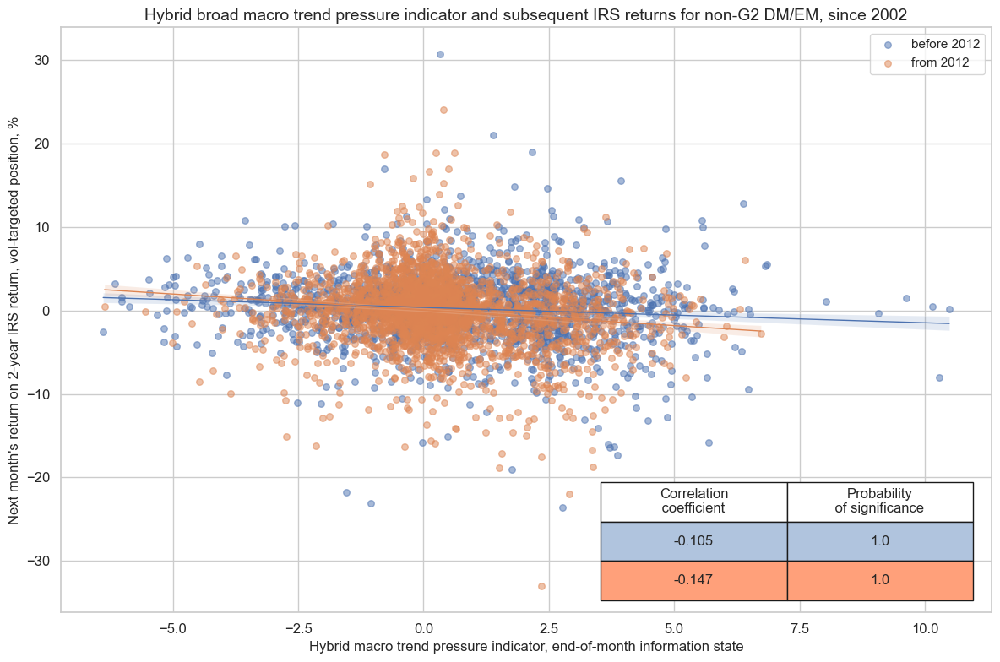

In [56]:
dix = dict_direct_oth
cr = dix["cr"]

cr["cr_XGHIPC_SCH"].reg_scatter(
    labels=False,
    coef_box="lower right",
    title="Hybrid broad macro trend pressure indicator and subsequent IRS returns for non-G2 DM/EM, since 2002",
    xlab="Hybrid macro trend pressure indicator, end-of-month information state",
    ylab="Next month's return on 2-year IRS return, vol-targeted position, %",
    separator=2012,
)

Also, all countries posted negative feature-target correlation.

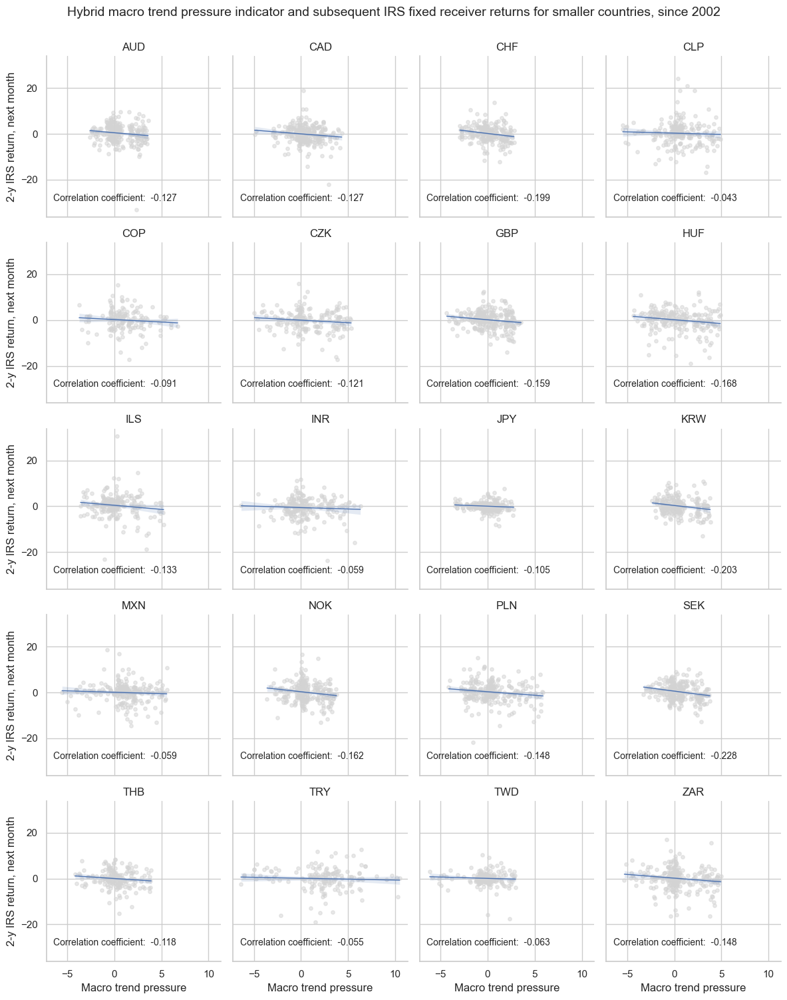

In [57]:
dix = dict_direct_oth
cr = dix["cr"]

cr_direct_oth["cr_XGHIPC_SCH"].reg_scatter(
    labels=False,
    coef_box="upper left",
    title="Hybrid macro trend pressure indicator and subsequent IRS fixed receiver returns for smaller countries, since 2002",
    xlab="Macro trend pressure",
    ylab="2-y IRS return, next month",
    separator="cids",
    size = (3,3)
)

#### Accuracy and correlation check

Accuracy ratios have been lower than for the G2. This is plausible since signal quality has been lower. However, it applies now to a much larger set of trades per period.

The [`SignalReturnRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#signalreturnrelations) class of the `macrosynergy.signal` module collects the main positioning factor and its key rivals (or constituents), and brings them into the right format by appropriate frequency conversion (which should correspond to the envisaged trading frequency) and whether the signal is supposed to predict the return positively or negatively. The result of the SignalReturnRelations calculation is then added to the custom dictionary `dict_direct_oth`

In [58]:
dix = dict_direct_oth

sigx = dix["sigs"]  # List of signal names
targx = dix["targs"] # List of possible targets
cidx = dix["cids"]  # cids selection
start = dix["start"] # start date
freqs = dix["freqs"]  # possible frequencies

srr = mss.SignalReturnRelations(
    df,
    cids=cidx,
    sigs=sigx,
    sig_neg=[True] * len(sigx),
    rets=targx,
    freqs=freqs,
    start=start,
    blacklist=fxblack,
)

dix["srr"] = srr

The `multiple_relations_table()` method, part of the `SignalReturnRelations` class within the `macrosynergy.signal` module, facilitates the comparison of multiple signal-return relationships within a single table. This method is particularly useful for evaluating the efficacy of various signals against identical return series across potentially different financial returns and frequencies. The table is structured such that the first column displays the target (financial return), and the second column shows the name of the signal, with `_NEG` appended to indicate a negative relationship to the named return. The table also includes standard columns that conform to established metrics such as accuracy, balanced accuracy, and others, which are detailed in  [MacroSynergy's documentation on summary tables](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#summary-tables). This structured approach allows for an intuitive and comprehensive assessment of signal performance in relation to various financial returns. With a simple customization we restrict the columns to the most relevant ones: 

In [59]:
dix = dict_direct_oth

srrx = dix["srr"]
freqs = dix["freqs"]
targx = dix["targs"]

# Table with renamed rows
dict_repl = dict(
    zip(
        [key + "_NEG" for key in direct_oth_labels.keys()],
        [val + " (neg)" for val in direct_oth_labels.values()],
    )
)
tbxx = (
    srrx.multiple_relations_table(signal_name_dict=dict_repl, freqs=freqs)
    .reset_index(level=["Aggregation"], drop=True)
    .reset_index()
)

# for column modifications
dict_cols = {
    "Signal" : "Signal",
    "Frequency": "Frequency",
    "accuracy": "Accuracy",
    "bal_accuracy": "Balanced accuracy",
    "pos_sigr": "Share of positive signals",
    "pos_retr": "Share of positive returns",
    "pearson": "Pearson coefficient",
    "kendall": "Kendall coefficient",
}

for xr in targx:

    tbx_xr = tbxx.loc[tbxx.Return == xr, list(dict_cols.keys())]
    tbx_xr.rename(columns=dict_cols, inplace=True)
   
    # Preserve the order of appearance for 'Signal'
    signals_order = tbx_xr['Signal'].unique()

    # Create a new DataFrame for sorted results
    sorted_dfs = []
    for signal in signals_order:
        # Filter data for current signal
        group = tbx_xr[tbx_xr['Signal'] == signal]

        # Sort 'Frequency' within the current 'Signal'
        sorted_group = group.sort_values(by='Frequency')
        
        # Append sorted group to list
        sorted_dfs.append(sorted_group)

    # Concatenate all sorted groups into one DataFrame
    tbx_xr = pd.concat(sorted_dfs)

    # Set the multi-index after sorting
    tbx_xr.set_index(["Signal", "Frequency"], inplace=True)


# apply style and heading

    tbx_xr = tbx_xr.style.format("{:.2f}").set_caption(
        f"Predictive accuracy and correlation with respect to {direct_oth_labels[xr]} returns").set_table_styles(
        [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}])

    display(tbx_xr)

The hybrid local-G2 trends indeed posted better prediction scores than the idiosyncratic trends alone.

Accuracy has been above 50% for most countries, which can be seen using the [`accuracy_bars`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#accuracy-bars) method, which shows accuracy and balanced accuracy of the predicted relationship. 

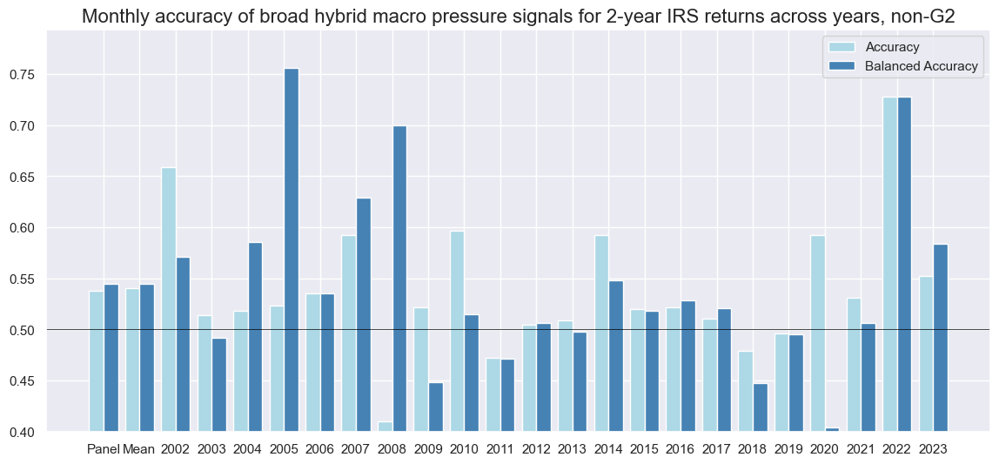

In [60]:
dix = dict_direct_oth
srrx = dix["srr"]
sigx= dix["sigs"]
targx = dix["targs"]

srrx.accuracy_bars(
    sigs = "XGHIPC_SCH_NEG",
    ret = "DU02YXR_VT10",
    freq = "M",
    type="years",
    title="Monthly accuracy of broad hybrid macro pressure signals for 2-year IRS returns across years, non-G2",
    size=(14, 6),
)

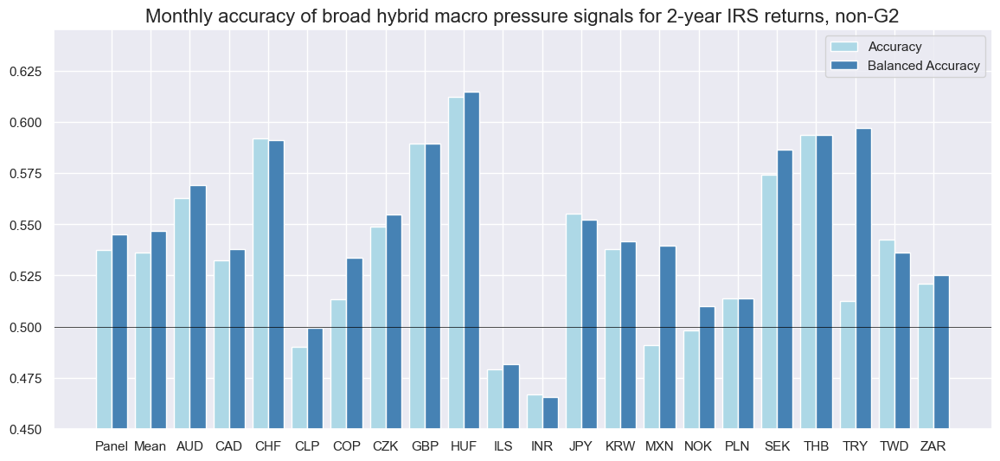

In [61]:
dix = dict_direct_oth
srrx = dix["srr"]
targx = dix["targs"]

srrx.accuracy_bars(
    sigs = "XGHIPC_SCH_NEG",
    ret = "DU02YXR_VT10",
    type="cross_section",
    title="Monthly accuracy of broad hybrid macro pressure signals for 2-year IRS returns, non-G2",
    size=(14, 6),
)

Similarly, the correlation has been positive for almost all countries, albeit only a few reach high significance based on their own data. Generally, significance is harder to establish for individual countries than for a panel. [`Correlation_bars()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#correlation-bars) method visualises both parametric and non-parametric correlation statistics.

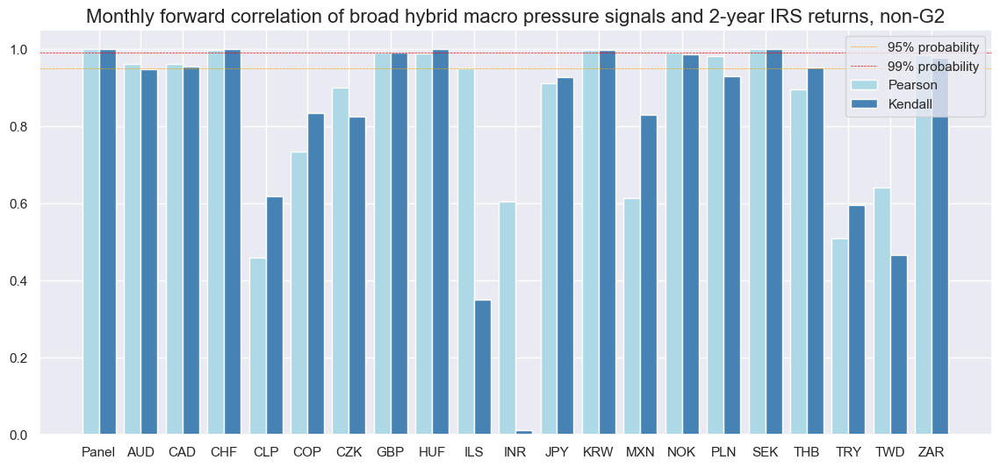

In [62]:
dix = dict_direct_oth
srrx = dix["srr"]
targx = dix["targs"]

srrx.correlation_bars(
    sigs = "XGHIPC_SCH_NEG",
    ret = "DU02YXR_VT10",
    type="cross_section",
    title="Monthly forward correlation of broad hybrid macro pressure signals and 2-year IRS returns, non-G2",
    size=(14, 6),
)

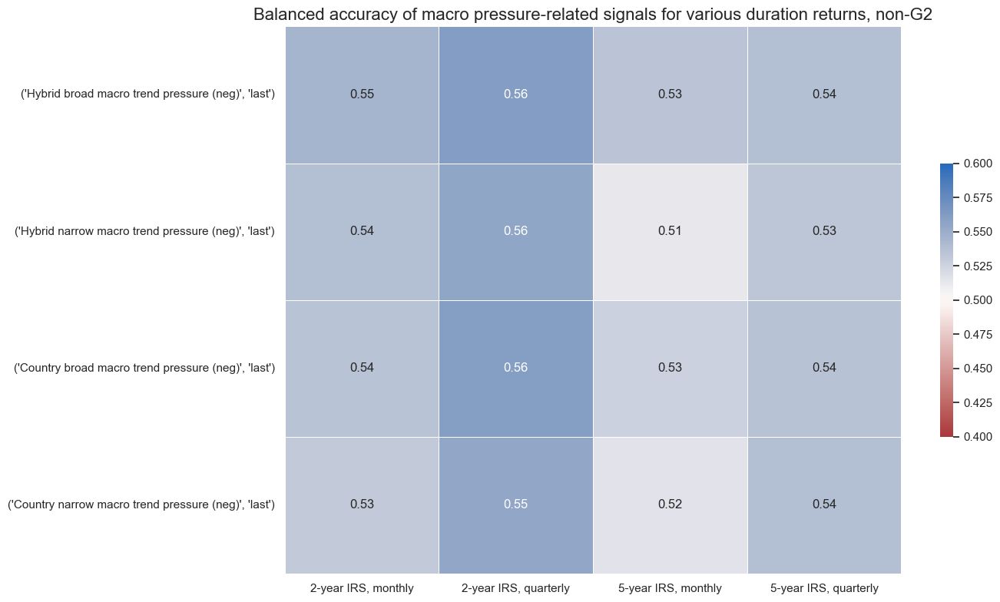

In [63]:
dix = dict_direct_oth
srrx = dix["srr"]
dict_repl = dict(zip([key + "_NEG" for key in direct_oth_labels.keys()], [val + " (neg)" for val in direct_oth_labels.values()]))


tbxx = srrx.single_statistic_table(
    stat="bal_accuracy",
    show_heatmap=True,
    signal_name_dict=dict_repl,
    column_names=["2-year IRS, monthly", "2-year IRS, quarterly", "5-year IRS, monthly", "5-year IRS, quarterly"],
    title="Balanced accuracy of macro pressure-related signals for various duration returns, non-G2",
    min_color=0.4,
    max_color=0.6,
    title_fontsize=16,
    round=2,
)

tbx_xr = tbxx.style.format("{:.2f}").set_caption(
    f"Balanced accuracy of macro pressure signals for duration returns"
).set_table_styles([
    {"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
])
display(tbx_xr)

#### PnLs

The [`NaivePnL`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#naivepnl) class of the `macrosynergy.pnl` module is the basis for calculating simple stylized PnLs for various signals under consideration of correlation benchmarks.

The related [`make_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-pnl) method calculates and stores generic PnLs based on a range of signals and their transformations into positions. The positioning options include the choice of trading frequency, z-scoring, simple equal-size long-short positions (-1/1) thresholds to prevent outsized positions, and rebalancing slippage.
The generated PnLs are, however, naive insofar as they do not consider trading costs and plausible risk management restrictions. Also, if a volatility scale is set, this is done so ex-post, mainly for the benefit of plotting different signals' PnLs in a single chart.

A complementary method is [`make_long_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-long-pnl), which calculates a "long-only" PnL based on a uniform long position across all markets at all times. This often serves as a benchmark for gauging the benefits of active trading.

In [64]:
dix = dict_direct_oth

sigx = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cids"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    df,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=fxblack,
  #  bms=["USD_EQXR_NSA", "USD_GB10YXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long")

dix["pnls"] = naive_pnl

The global PnL for small countries can only be calculated from 2002 and shows reasonably consistent value generation, albeit the post-pandemic PnL growth has contributed more than half the value and emphasize the point of seasonality: macro trends generate most value when they are strong and clear.

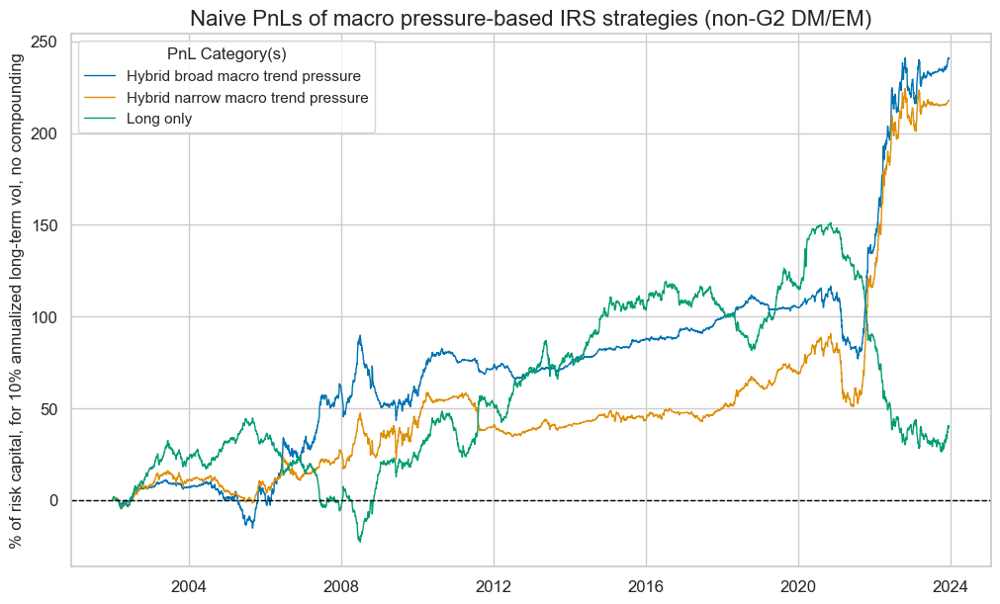

In [65]:
dix = dict_direct_oth

start = dix["start"]
cidx = dix["cids"]
sigx=dix["sigs"]
pnlx = dix["pnls"]

pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long"]
start = dix["start"]

pnl_direct_oth={key + "_PZN": value for key, value in direct_oth_labels.items()}
pnl_direct_oth_labels = {key: pnl_direct_oth[key] for key in list(pnl_direct_oth)[:2]}
pnl_direct_oth_labels["Long"] = "Long only"

pnlx.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    title="Naive PnLs of macro pressure-based IRS strategies (non-G2 DM/EM)",
    title_fontsize=16,
    xcat_labels=pnl_direct_oth_labels,
)

Macro trend signals of all types produce higher PnLs than a long-only or position or even than G2 positions based on the same signal type. Also, benchmark correlation has been near zero. All this emphasizes the benefit of added idiosyncratic information and a larger set of traded countries.

In [66]:
dix = dict_direct_oth

start = dix["start"]
cidx = dix["cids"]
sigx=dix["sigs"]
pnlx=dix["pnls"]

pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long"]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

df_eval = df_eval.rename(columns=pnl_direct_oth_labels)


df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics of macro pressure-based IRS strategies (non-G2 DM/EM)"
    ).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
    ])

display(df_eval)



xcat,Hybrid broad macro trend pressure,Hybrid narrow macro trend pressure,Long only
Return %,11.02,9.96,1.85
St. Dev. %,10.00,10.00,10.00
Sharpe Ratio,1.10,1.00,0.18
Sortino Ratio,1.69,1.52,0.26
Max 21-Day Draw %,-21.67,-24.12,-22.03
Max 6-Month Draw %,-35.44,-35.60,-53.37
Peak to Trough Draw %,-46.46,-39.91,-125.10
Top 5% Monthly PnL Share,0.94,0.97,3.41
Traded Months,264.00,264.00,264.00


Positions often had the same direction across countries before and after countries. However, they have been mixed in the 2010s.

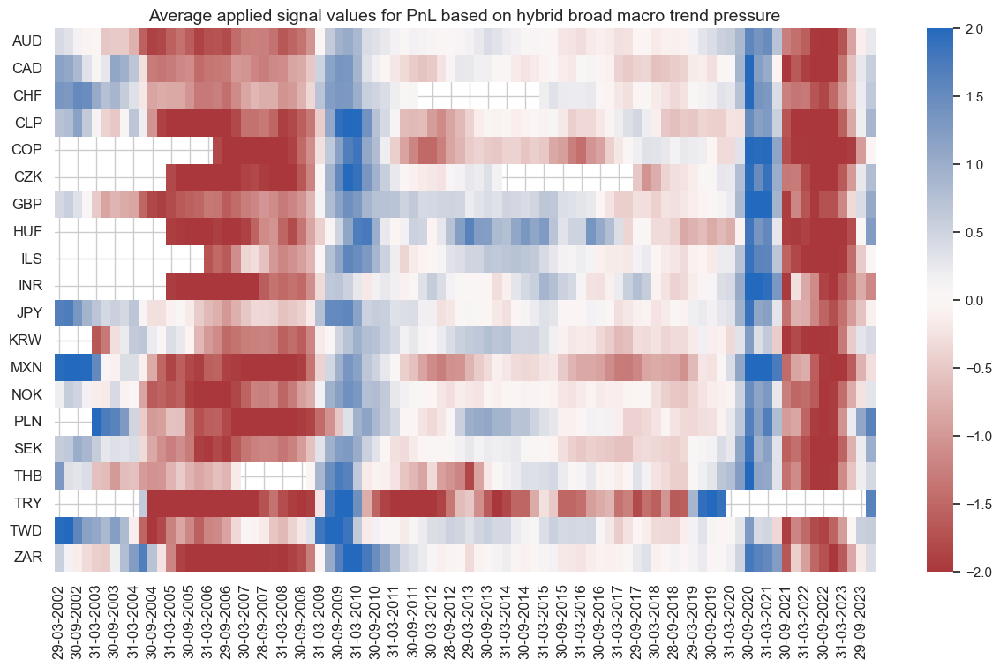

In [67]:
dix = dict_direct_oth
pnlx = dix["pnls"]
sigx=dix["sigs"]
freqs=dix["freqs"]

pnlx.signal_heatmap(pnl_name="XGHIPC_SCH_PZN", 
                    freq="q", 
                    title="Average applied signal values for PnL based on hybrid broad macro trend pressure",  # Access the first value 
                    figsize=(15, 8))

# 3.3. Non-G2 relative to G2 pressure factors

The below strategy type aligns idiosyncratic macro trends of the smaller countries relative to the G2 with vol-targeted IRS returns relative to similar returns in the G2.

To enable consistent and efficient analysis across various hypotheses, we have developed a custom dictionary, named `dict_relg2`, tailored for the third hypothesis. This dictionary is designed with specific keys to streamline data handling and analysis:

- `sigs`: A list of selected, plausible trading signals, which can later be analyzed in comparison to each other ["XGHIPCvG2",
"XGHIvG2", "INTRGDPv5Y_NSA_P1M1ML12_3MMAvG2", "CPIH_SA_PALLvIETvG2", "CPIC_SA_PALLvIETvG2", "PCREDITBN_SJA_P1M1ML12vLTBvG2"].
- `targs`: A list of selected targets, specifically returns, which we aim to surpass using the chosen signals. Here, we are choosing the relative IRS returns ["DU02YXR_VT10vG2", "DU05YXR_VT10vG2"]
- `cids`: A list identifying different cross-sections for detailed analysis `cids_xg2` - a list of all available currencies, excluding USD and EUR.
- `start`:  The start date for the data period under analysis, set to "2000-01-01".
- `cr`: short for "Category Relations": class from the `macrosynnergy.panel` package, designed to organize panels of signals and targets into formats suitable for analysis. This key will be populated post-calculations.
- `freqs`: A list of frequencies, including M for monthly and Q for quarterly.
- `srr`: Short for "Signal Returns Relations," this key is used to compute the relationships between panels of the selected trading signals (`sigs`) and the panels of subsequent returns from the list (`targs`). This key will be populated post-calculations.
- `pnls`: This key will later contain the time series of naive trading Profit and Loss (PnL), calculated by using each signal from the  `sigs` list as the trading signal for the corresponding return from the `targs` list.

#### Specs

Similar to the directional strategies, we start by defining a dictionary with the key parameters necessary for evaluating a specific type of strategy. This includes setting the signals, target returns, cross-sections, initial date, and analysis frequencies for evaluating a relative (to G2) IRS strategy for smaller currencies. Additionally, to facilitate easier interpretation, we define a dictionary of labels where the keys are the technical names of the indicators and the values provide their explanations.

In [68]:

relg2_labels = {
    "XGHIPCvG2": "Broad macro trend pressure vs G2",
    "XGHIvG2": "Growth and inflation trend pressure vs G2",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMAvG2": "Excess real GDP growth trend vs G2",
    "CPIH_SA_PALLvIETvG2": "Excess CPI headline inflation trend vs G2",
    "CPIC_SA_PALLvIETvG2": "Excess CPI core inflation trend vs G2",
    "PCREDITBN_SJA_P1M1ML12vLTBvG2": "Excess private credit growth trend vs G2",
    "DU02YXR_VT10vG2": "2-year IRS receiver vs G2, vol targeted",
    "DU05YXR_VT10vG2": "5-year IRS receiver vs G2, vol targeted"
}


dict_relg2 = {
    "sigs": [key for key in relg2_labels.keys()][:6],
    "targs": ["DU02YXR_VT10vG2", "DU05YXR_VT10vG2"],
    "cids": cids_xg2,
    "start": "2000-01-01",
    "freqs": ["M", "Q"],
    "cr": None,
    "srr": None,
    "pnls": None,
}

The negative correlation between relative macro trends and subsequent returns has been less pronounced than for absolute values. This plausibly reflects the greater statistical uncertainty around relative trends. However, it was still significant and confirmed that trend effects were not all dominated by a single global or G2 factor. This creates confidence in the signals universal applicability in trading strategies.

Instances of the [`CategoryRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#investigate-relations-between-panels-with-categoryrelations) class from the `macrosynnergy.panel` package are designed to organize panels of features and targets into formats suitable for analysis. This class provides functionalities for frequency conversion, adding lags, and trimming outliers. The outcome of the CategoryRelations calculation is subsequently added to the custom dictionary `dict_relg2` under the key `cr`.

In [69]:
dix = dict_relg2

sigx = dix["sigs"]  # List of signal names
targ = dix["targs"][0]  # Assuming only one target for simplicity
cidx = dix["cids"]  # cids selection
start = dix["start"]

cr_relg2 = {}

for sig in sigx:
    cr_relg2[f"cr_{sig}"] = msp.CategoryRelations(
        df,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        blacklist=fxblack,
        start=start,
        xcat_trims=[None, None]
    )

dix["cr"] = cr_relg2

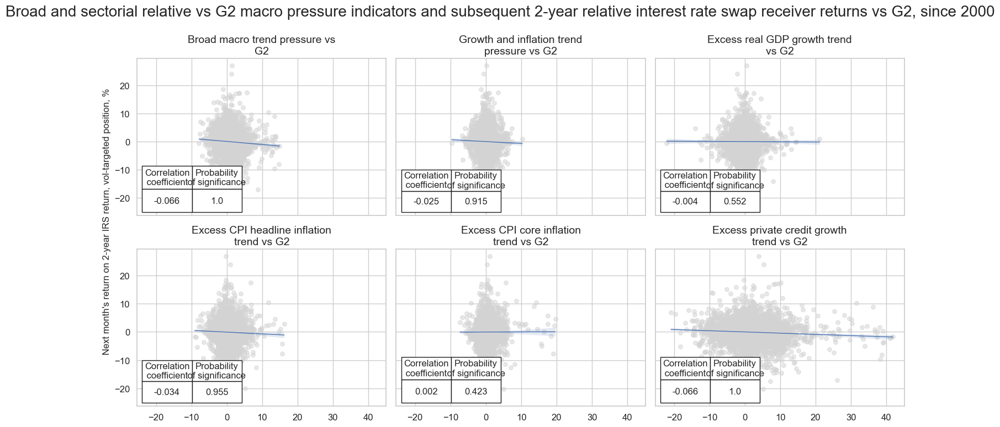

In [70]:
dix = dict_relg2
cr = dix["cr"]

msv.multiple_reg_scatter(
        [cr["cr_XGHIPCvG2"], cr["cr_XGHIvG2"], cr["cr_INTRGDPv5Y_NSA_P1M1ML12_3MMAvG2"], cr["cr_CPIH_SA_PALLvIETvG2"], cr["cr_CPIC_SA_PALLvIETvG2"], cr["cr_PCREDITBN_SJA_P1M1ML12vLTBvG2"]],
        title="Broad and sectorial relative vs G2 macro pressure indicators and subsequent 2-year relative interest rate swap receiver returns vs G2, since 2000",
        ylab="Next month's return on 2-year IRS return, vol-targeted position, %",
        ncol=3,
        nrow=2,
        figsize=(15, 8),
        prob_est="map",
        coef_box="lower left", 
        subplot_titles=[lab for lab in list(relg2_labels.values())[0:6]])

#### Accuracy and correlation check

Also, accuracy scores have been lower for relative trends and returns. However, the reduced correlation of signals means that the incremental contribution of each signal to a global PnL has also been higher. Put simply, there has been a trade-off between quality and information value. [`SignalReturnRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#signalreturnrelations) is used again to collect the signal-return relationships for the chosen frequencies. The result of the SignalReturnRelations calculation is then added to the custom dictionary `dict_relg2` under the key `srr`

In [71]:
dix = dict_relg2

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cids"]
start = dix["start"]
freqs = dix["freqs"]

srr = mss.SignalReturnRelations(
    df,
    cids=cidx,
    sigs=sigx,
    blacklist=fxblack,
    sig_neg=[True] * len(sigx),
    rets=targx,
    freqs=freqs,
    start=start,
)

dix["srr"] = srr

In [72]:
dix = dict_relg2

srrx = dix["srr"]
freqs = dix["freqs"]
targx = dix["targs"]

# Table with renamed rows
dict_repl = dict(
    zip(
        [key + "_NEG" for key in relg2_labels.keys()],
        [val + " (neg)" for val in relg2_labels.values()],
    )
)
tbxx = (
    srrx.multiple_relations_table(signal_name_dict=dict_repl, freqs=freqs)
    .reset_index(level=["Aggregation"], drop=True)
    .reset_index()
)

# for column modifications
dict_cols = {
    "Signal" : "Signal",
    "Frequency": "Frequency",
    "accuracy": "Accuracy",
    "bal_accuracy": "Balanced accuracy",
    "pos_sigr": "Share of positive signals",
    "pos_retr": "Share of positive returns",
    "pearson": "Pearson coefficient",
    "kendall": "Kendall coefficient",
}

for xr in targx:

    tbx_xr = tbxx.loc[tbxx.Return == xr, list(dict_cols.keys())]
    tbx_xr.rename(columns=dict_cols, inplace=True)
 
    # Preserve the order of appearance for 'Signal'
    signals_order = tbx_xr['Signal'].unique()

    # Create a new DataFrame for sorted results
    sorted_dfs = []
    for signal in signals_order:
        # Filter data for current signal
        group = tbx_xr[tbx_xr['Signal'] == signal]

        # Sort 'Frequency' within the current 'Signal'
        sorted_group = group.sort_values(by='Frequency')
        
        # Append sorted group to list
        sorted_dfs.append(sorted_group)

    # Concatenate all sorted groups into one DataFrame
    tbx_xr = pd.concat(sorted_dfs)

    # Set the multi-index after sorting
    tbx_xr.set_index(["Signal", "Frequency"], inplace=True)


# apply style and heading

    tbx_xr = tbx_xr.style.format("{:.2f}").set_caption(
        f"Predictive accuracy and correlation with respect to {relg2_labels[xr]} returns").set_table_styles(
        [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}])

    display(tbx_xr)

All signal versions and constituents display above 50% accuracy ratios, but not all have significant correlation.

#### PnLs

PnLs are now generated for relative positions versus the G2, which in practice would require more leverage and cause higher transaction costs than simple directional strategies. Since leverage constraints and transaction costs are not considered here, comparisons with directional strategy are not fully valid.

The [`NaivePnL`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#naivepnl) class of the `macrosynergy.pnl` module is the basis for calculating simple stylized PnLs for various signals under consideration of correlation benchmarks.

The related [`make_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-pnl) method calculates and stores generic PnLs based on a range of signals and their transformations into positions. The positioning options include the choice of trading frequency, z-scoring, simple equal-size long-short positions (-1/1) thresholds to prevent outsized positions, and rebalancing slippage.
The generated PnLs are, however, naive insofar as they do not consider trading costs and plausible risk management restrictions. Also, if a volatility scale is set, this is done so ex-post, mainly for the benefit of plotting different signals' PnLs in a single chart.

A complementary method is [`make_long_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-long-pnl), which calculates a "long-only" PnL based on a uniform long position across all markets at all times. This often serves as a benchmark for gauging the benefits of active trading.

In [73]:
dix = dict_relg2

sigx = dix["sigs"]
targx = dix["targs"][0]
cidx = dix["cids"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    df,
    ret=targx,
    sigs=sigx,
    blacklist=fxblack,
    cids=cidx,
    start=start,
 #   bms=["USD_EQXR_NSA", "USD_GB10YXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long versus G2")

dix["pnls"] = naive_pnl

Relative trend-based positioning has produced fairly consistent value generation most of the time. It failed to do so during and after the pandemic when relative macro trends were particularly difficult to read. Simple cumulative PnLs in the class instance can be plotted with the [`plot_pnls()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#plot-pnls) method.

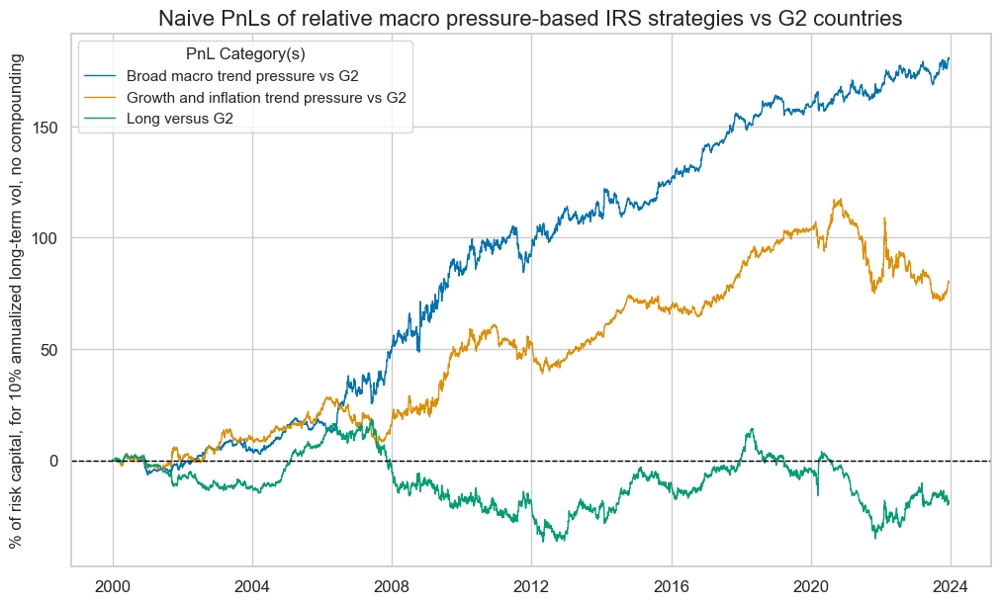

In [74]:
dix = dict_relg2

start = dix["start"]
cidx = dix["cids"]
sigx = dix["sigs"]
pnlx = dix["pnls"]

pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long versus G2"]

pnl_relg2={key + "_PZN": value for key, value in relg2_labels.items()}
pnl_relg2_labels = {key: pnl_relg2[key] for key in list(pnl_relg2)[:2]}
pnl_relg2_labels["Long versus G2"] = "Long versus G2"


pnlx.plot_pnls(
    pnl_cats=pnls,
    title="Naive PnLs of relative macro pressure-based IRS strategies vs G2 countries",
    xcat_labels=pnl_relg2_labels,
    title_fontsize=16,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    pnl_cids=["ALL"],
    start=start,
)

The broad relative macro excess trend (including credit) produced much more naive value than the narrow trend.

In [75]:
dix = dict_relg2

start = dix["start"]
pnlx = dix["pnls"]
sigx = dix["sigs"]
pnlx = dix["pnls"]

pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long versus G2"]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

df_eval = df_eval.rename(columns=pnl_relg2_labels)

# apply style and heading

df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics of relative (vs G2) macro pressure-based IRS strategies position"
    ).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
    ])

display(df_eval)



xcat,Broad macro trend pressure vs G2,Growth and inflation trend pressure vs G2,Long versus G2
Return %,7.58,3.37,-0.81
St. Dev. %,10.00,10.00,10.00
Sharpe Ratio,0.76,0.34,-0.08
Sortino Ratio,1.11,0.49,-0.11
Max 21-Day Draw %,-12.89,-15.08,-10.73
Max 6-Month Draw %,-15.36,-29.35,-22.99
Peak to Trough Draw %,-20.96,-46.09,-55.52
Top 5% Monthly PnL Share,0.64,1.24,-4.64
Traded Months,288.00,288.00,288.00


Relative signals have been a lot more diverse than absolute signals. On the positive side, this enhances diversification of exposure. On the negative side, this can lead to very uneven value at risk of the strategy and challenges for risk management. Also, the instability of the relative signal around the pandemic suggests that the value of relative macro trend signals, as opposed to absolute trend signals, may be compromised at times of crisis and distortions. This reflects that the timing of the distortion influence may vary across countries.

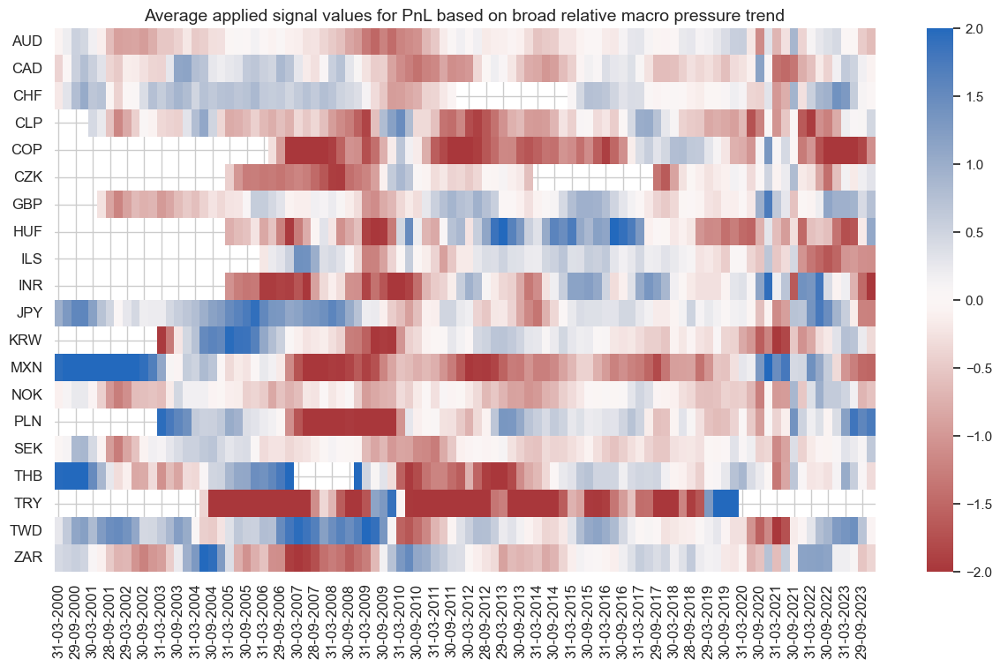

In [76]:
dix = dict_relg2
pnlx = dix["pnls"]
sigx = dix["sigs"]

pnlx.signal_heatmap(pnl_name="XGHIPCvG2_PZN", 
                    freq="q", 
                    title=f"Average applied signal values for PnL based on broad relative macro pressure trend",   
                    figsize=(15, 8))

# 3.4. Global relative pressure factors

This section checks the value of relative macro trends for each country versus an average of all other (available and tradable) countries. This signal focuses fully on the idiosyncratic macro excess trend of each country, making no distinction between large and small countries or developed and emerging countries. Statistical uncertainty around the signals would be particularly high, but independence of the cross sectional signals would also be particularly pronounced.

To ensure consistent computations with the hypotheses above, we also establish a custom dictionary with specific keys designed to streamline the analysis, `dict_global`, including:

- `sigs`: A list of selected, plausible trading signals, which can later be analyzed in comparison to each other. ["XGHIPCvGLB", "XGHIvGLB",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMAvGLB", "CPIH_SA_PALLvIETvGLB", "CPIC_SA_PALLvIETvGLB", "PCREDITBN_SJA_P1M1ML12vLTBvGLB"]
- `targs`: A list of selected targets, specifically returns, which we aim to surpass using the chosen signals ["DU02YXR_VT10vGLB", "DU05YXR_VT10vGLB"]. 
- `cids`: A list identifying different cross-sections for detailed analysis, a list of all available tradeable markets `cids_dux`
- `start`:  The start date for the data period under analysis, set to `"2000-01-01"`.
- `freqs`: A list of frequencies, including `M` for monthly and `Q` for quarterly.
- `cr`: short for "Category Relations": class from the `macrosynnergy.panel` package, designed to organize panels of signals and targets into formats suitable for analysis. This key will be populated post-calculations.
- `srr`: Short for "Signal Returns Relations," this key is used to compute the relationships between panels of the selected trading signals (`sigs`) and the panels of subsequent returns from the list (`targs`). This key will be populated post-calculations.
- `pnls`: This key will later contain the time series of naive trading Profit and Loss (PnL), calculated by using each signal from the  `sigs` list as the trading signal for the corresponding return from the `targs` list.

#### Specs and correlation

Here we also start by defining a dictionary with the key parameters necessary for evaluating a global relative IRS strategy. This includes setting the signals, target returns, cross-sections, initial date, and analysis frequencies for evaluating a global relative IRS strategy for all available markets. Additionally, to facilitate easier interpretation, we define a dictionary of labels where the keys are the technical names of the indicators and the values provide their explanations.

In [77]:
global_labels = {
    "XGHIPCvGLB": "Broad macro trend pressure relative to global basket",
    "XGHIvGLB": "Growth and inflation trend pressure relative to global basket",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMAvGLB": "Excess real GDP growth trend relative to global basket",
    "CPIH_SA_PALLvIETvGLB": "Excess headline CPI inflation trend relative to global basket",
    "PCREDITBN_SJA_P1M1ML12vLTBvGLB": "Excess private credit growth trend relative to global basket",
    "DU02YXR_VT10vGLB": "2-year IRS relative vol targeted returns", 
    "DU05YXR_VT10vGLB": "5-year IRS relative vol targeted returns" 
}

dict_global = {
    "sigs": [key for key in global_labels.keys()][:5],
    "targs": ["DU02YXR_VT10vGLB", "DU05YXR_VT10vGLB"],
    "cids": cids_dux,
    "start": "2002-01-01",
    "freqs": ["M", "Q"],
    "cr": None,
    "srr": None,
    "pnls": None,
}

The significant negative correlation holds for purely relative signals and subsequent returns. Indeed it has been statistically significant for weekly, monthly, and quarterly horizons.

Instances of the [`CategoryRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#investigate-relations-between-panels-with-categoryrelations) class from the `macrosynnergy.panel` package are designed to organize panels of features and targets into formats suitable for analysis. This class provides functionalities for frequency conversion, adding lags, and trimming outliers. The outcome of the CategoryRelations calculation is subsequently added to the custom dictionary `dict_global` under the key `cr`. The method `reg_scatter` within the class is used to display a correlation scatter plot of either the complete pooled data or a specific subset. For simultaneous analysis of multiple relationships, the `multiple_reg_scatter()` method can be employed.

In [78]:
dix = dict_global

sigx = dix["sigs"]  # List of signal names
targx = dix["targs"][0]  # Assuming only one target for simplicity
cidx = dix["cids"]  # cids selection
start = dix["start"]


cr_global = {}

for sig in sigx:
    cr_global[f"cr_{sig}"] = msp.CategoryRelations(
        df,
        xcats=[sig, targx],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        blacklist=fxblack,
        start=start,
        xcat_trims=[None, None]
    )

dix["cr"] = cr_global 

`multiple_reg_scatter()` method allows comparison of several pairs of two categories relationships side by side, including the strength of the linear association and any potential outliers. By default, it includes a regression line with a 95% confidence interval, which can help assess the significance of the relationship. 

The `prob_est` argument in this context is used to specify which type of estimator to use for calculating the probability of a significant relationship between the feature category and the target category.`prob_est` is `"map"`, which stands for "Macrosynergy panel test". Often, cross-sectional experiences are not independent and subject to common factors. Simply stacking data can lead to “pseudo-replication” and overestimated significance of correlation. A better method is to check significance through panel regression models with period-specific random effects. This technique adjusts targets and features of the predictive regression for common (global) influences. The stronger these global effects, the greater the weight of deviations from the period-mean in the regression. In the presence of dominant global effects, the test for the significance of a feature would rely mainly upon its ability to explain cross-sectional target differences. Conveniently, the method automatically accounts for the similarity of experiences across sections when assessing the significance and, hence, can be applied to a wide variety of features and targets. View a related research post [here](https://research.macrosynergy.com/testing-macro-trading-factors) that provides more information on this approach.

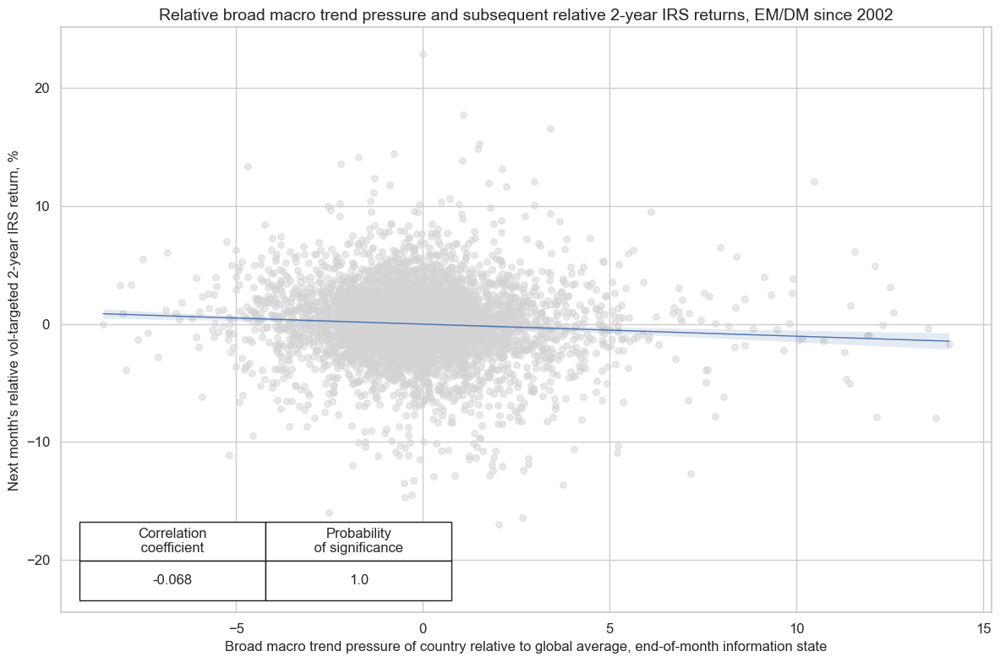

In [79]:
dix = dict_global
cr = dix["cr"]

cr["cr_XGHIPCvGLB"].reg_scatter(
    labels=False,
    coef_box="lower left",
    title="Relative broad macro trend pressure and subsequent relative 2-year IRS returns, EM/DM since 2002",
    xlab="Broad macro trend pressure of country relative to global average, end-of-month information state",
    ylab="Next month's relative vol-targeted 2-year IRS return, %",
)

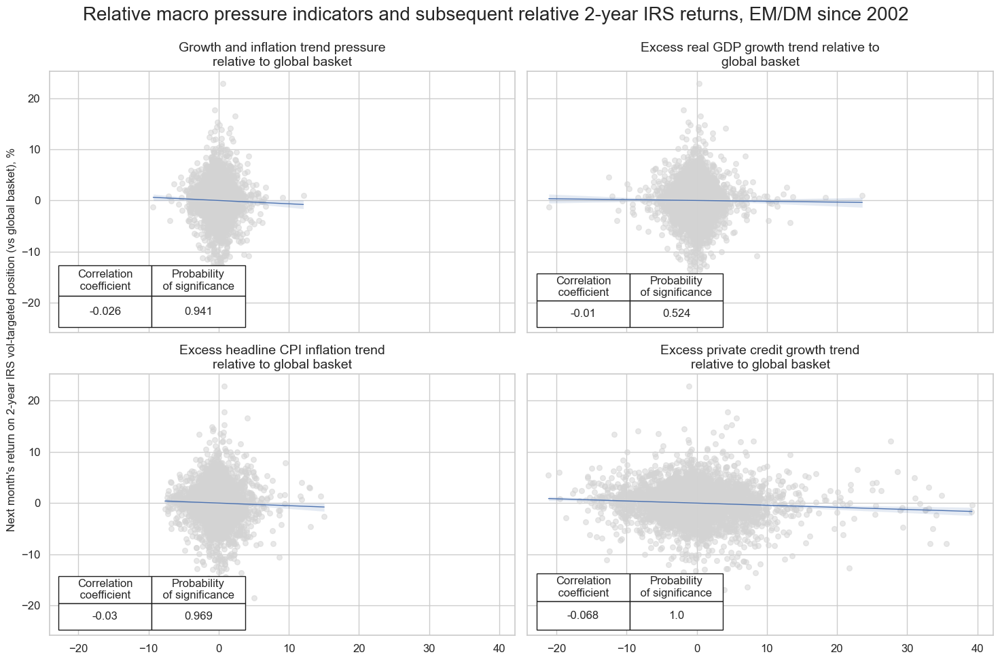

In [80]:
dix = dict_global
cr = dix["cr"]


msv.multiple_reg_scatter(
        cat_rels=[cr["cr_"+ key] for key in list(global_labels.keys())[1:5]],
        title="Relative macro pressure indicators and subsequent relative 2-year IRS returns, EM/DM since 2002",
        ylab="Next month's return on 2-year IRS vol-targeted position (vs global basket), %",
        ncol=2,
        nrow=2,
        figsize=(15, 10),
        prob_est="map",
        coef_box="lower left", 
        subplot_titles=[lab for lab in list(global_labels.values())[1:5]])

Negative correlation has been confirmed both various splits of the sample and most cross sections, despite some massive outliers that have been unrelated to macro trends.

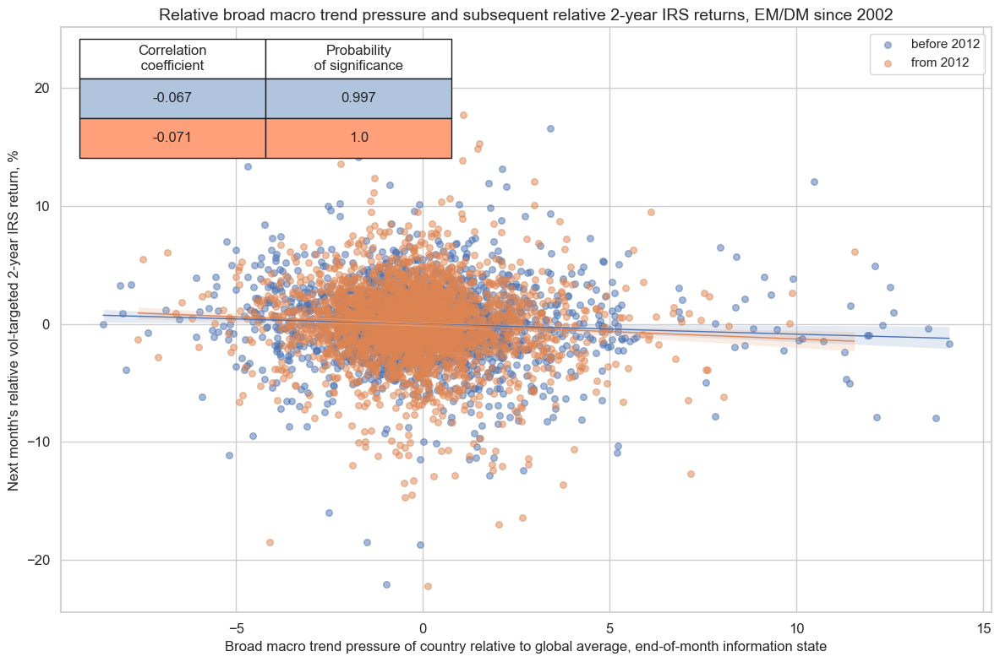

In [81]:
dix = dict_global
cr = dix["cr"]

cr["cr_XGHIPCvGLB"].reg_scatter(
    labels=False,
    coef_box="upper left",
    title="Relative broad macro trend pressure and subsequent relative 2-year IRS returns, EM/DM since 2002",
    xlab="Broad macro trend pressure of country relative to global average, end-of-month information state",
    ylab="Next month's relative vol-targeted 2-year IRS return, %",
    separator=2012,
)

#### Accuracy and correlation check

The [`SignalReturnRelations`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#signalreturnrelations) class of the `macrosynergy.signal` module collects the main positioning factor and its key rivals (or constituents), and brings them into the right format by appropriate frequency conversion (which should correspond to the envisaged trading frequency) and whether the signal is supposed to predict the return positively or negatively. The result of the SignalReturnRelations calculation is then added to the custom dictionary `dict_global`.

Accuracy and balanced accuracy for the broadest relative macro trend have actually been higher than for relative trends versus the G2.

In [82]:
dix = dict_global

sigx = dix["sigs"]
targx = dix["targs"]
cidx = dix["cids"]
start = dix["start"]
freqs = dix["freqs"]

srr = mss.SignalReturnRelations(
    df,
    cids=cidx,
    sigs=sigx,
    sig_neg=[True] * len(sigx),
    rets=targx,
    freqs=freqs,
    start=start,
    blacklist=fxblack,
)

dix["srr"] = srr

The `multiple_relations_table()` method, part of the `SignalReturnRelations` class within the `macrosynergy.signal` module, facilitates the comparison of multiple signal-return relationships within a single table. This method is particularly useful for evaluating the efficacy of various signals against identical return series across potentially different financial returns and frequencies. The table is structured such that the first column displays the target (financial return), and the second column shows the name of the signal, with `_NEG` appended to indicate a negative relationship to the named return. The table also includes standard columns that conform to established metrics such as accuracy, balanced accuracy, and others, which are detailed in  [MacroSynergy's documentation on summary tables](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#summary-tables). This structured approach allows for an intuitive and comprehensive assessment of signal performance in relation to various financial returns.

In [83]:
dix = dict_global

srrx = dix["srr"]
freqs = dix["freqs"]
targx = dix["targs"]

dict_repl = dict(
    zip(
        [key + "_NEG" for key in global_labels.keys()],
        [val + " (neg)" for val in global_labels.values()],
    )
)
tbxx = (
    srrx.multiple_relations_table(signal_name_dict=dict_repl, freqs=freqs)
    .reset_index(level=["Aggregation"], drop=True)
    .reset_index()
)

dict_cols = {
    "Signal": "Signal",
    "Frequency": "Frequency",
    "accuracy": "Accuracy",
    "bal_accuracy": "Balanced accuracy",
    "pos_sigr": "Share of positive signals",
    "pos_retr": "Share of positive returns",
    "pearson": "Pearson coefficient",
    "kendall": "Kendall coefficient",
}

for xr in targx:

    tbx_xr = tbxx.loc[tbxx.Return == xr, list(dict_cols.keys())]
    tbx_xr.rename(columns=dict_cols, inplace=True)

    
    # Preserve the order of appearance for 'Signal'
    signals_order = tbx_xr['Signal'].unique()

    # Create a new DataFrame for sorted results
    sorted_dfs = []
    for signal in signals_order:
        # Filter data for current signal
        group = tbx_xr[tbx_xr['Signal'] == signal]

        # Sort 'Frequency' within the current 'Signal'
        sorted_group = group.sort_values(by='Frequency')
        
        # Append sorted group to list
        sorted_dfs.append(sorted_group)

    # Concatenate all sorted groups into one DataFrame
    tbx_xr = pd.concat(sorted_dfs)

    # Set the multi-index after sorting
    tbx_xr.set_index(["Signal", "Frequency"], inplace=True)


# apply style and heading

    tbx_xr = tbx_xr.style.format("{:.2f}").set_caption(
        f"Predictive accuracy and correlation with respect to {global_labels[xr]}").set_table_styles(
        [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}])

    display(tbx_xr)

The detailed scoring of the predictive value of relative macro trends suggests that it relies mainly on relative credit trends. Relative growth and inflation have been less successful in predicting relative swap returns.

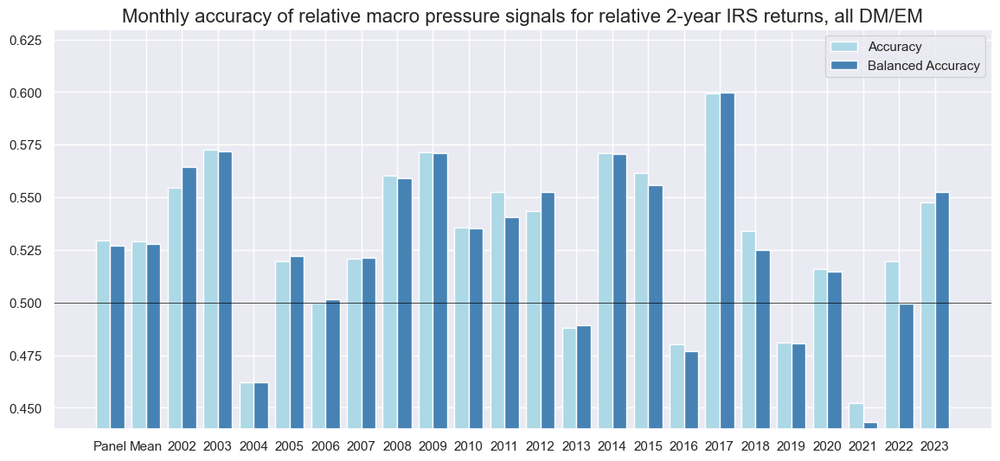

In [84]:
dix = dict_global
srrx = dix["srr"]
targx = dix["targs"]

srrx.accuracy_bars(
    sigs = "XGHIPCvGLB_NEG",
    ret = "DU02YXR_VT10vGLB",
    freq = "M",
    type="years",
    title="Monthly accuracy of relative macro pressure signals for relative 2-year IRS returns, all DM/EM",
    size=(14, 6),
)

#### PnLs

Relative trend PnLs have produced good naive value but likely incurred much higher trading costs than directional strategies. The consistency of the value generation suggests, however, that relative macro trends are a valid guidance for the allocation of duration exposure across currency areas. 

The [`NaivePnL`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#naivepnl) class of the `macrosynergy.pnl` module is the basis for calculating simple stylized PnLs for various signals under consideration of correlation benchmarks.

The related [`make_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-pnl) method calculates and stores generic PnLs based on a range of signals and their transformations into positions. The positioning options include the choice of trading frequency, z-scoring, simple equal-size long-short positions (-1/1) thresholds to prevent outsized positions, and rebalancing slippage.
The generated PnLs are, however, naive insofar as they do not consider trading costs and plausible risk management restrictions. Also, if a volatility scale is set, this is done so ex-post, mainly for the benefit of plotting different signals' PnLs in a single chart.

A complementary method is [`make_long_pnl()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#make-long-pnl), which calculates a "long-only" PnL based on a uniform long position across all markets at all times. This often serves as a benchmark for gauging the benefits of active trading.

In [85]:
dix = dict_global

sigx = dix["sigs"]
targx = dix["targs"][0]
cidx = dix["cids"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    df,
    ret=targx,
    sigs=sigx,
    cids=cidx,
    blacklist=fxblack,
    start=start,
    
#    bms=["USD_EQXR_NSA", "USD_GB10YXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=True,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long vs global")

dix["pnls"] = naive_pnl 

Simple cumulative PnLs in the class instance can be plotted with the [`plot_pnls()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#plot-pnls) method. They mainly inform on seasonality and stability of value generation under the assumption of negligible transaction costs.

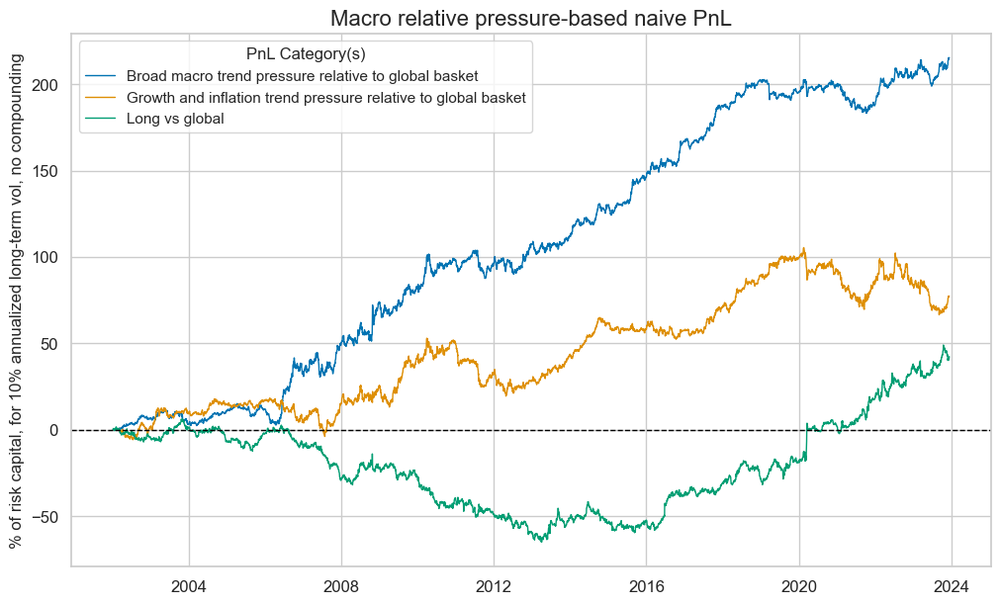

In [86]:
dix = dict_global

sigx = dix["sigs"]
cidx = dix["cids"]
pnlx = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long vs global"]

pnl_global={key + "_PZN": value for key, value in global_labels.items()}
pnl_global_labels = {key: pnl_global[key] for key in list(pnl_global)[:2]}
pnl_global_labels["Long vs global"] = "Long vs global"

pnlx.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    title="Macro relative pressure-based naive PnL",
    title_fontsize=16,
    ylab="% of risk capital, for 10% annualized long-term vol, no compounding",
    xcat_labels=pnl_global_labels,
)

The [`evaluate_pnls()`](https://macrosynergy.com/academy/notebooks/introduction-to-macrosynergy-package/#evaluate-pnls) method displays a few characteristic performance metrics of selected signals' naive PnLs. They illustrate that macro trend pressure-based portfolios generated much higher Sharpe ratios than the long-only portfolio with zero to negative correlation to duration return benchmarks.

In [87]:
dix = dict_global

start = dix["start"]
cidx = dix["cids"]
pnlx = dix["pnls"]
sigx = dix["sigs"]
pnls = [sig + "_PZN" for sig in sigx[:2]] + ["Long vs global"]

df_eval = pnlx.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

df_eval = df_eval.rename(columns=pnl_global_labels)

# apply style and heading

df_eval = df_eval.style.format("{:.2f}").set_caption(
    f"Performance metrics of macro pressure-based relative IRS strategies (all DM/EM)"
).set_table_styles(
    [{"selector": "caption", "props": [("text-align", "center"), ("font-weight", "bold"), ("font-size", "17px")]}
])
display(df_eval)

xcat,Broad macro trend pressure relative to global basket,Growth and inflation trend pressure relative to global basket,Long vs global
Return %,9.83,3.53,1.93
St. Dev. %,10.00,10.00,10.00
Sharpe Ratio,0.98,0.35,0.19
Sortino Ratio,1.47,0.51,0.28
Max 21-Day Draw %,-13.87,-18.35,-9.55
Max 6-Month Draw %,-14.76,-20.35,-17.14
Peak to Trough Draw %,-19.52,-38.87,-71.27
Top 5% Monthly PnL Share,0.61,1.28,2.14
Traded Months,264.00,264.00,264.00


In [88]:
dix = dict_global
sigx = dix["sigs"]
cidx = dix["cids"]
freqs = dix["freqs"]

for fr in freqs:

  results = msn.create_results_dataframe(
    title=f"Performance metrics of relative macro pressure signals based strategies, {fr} frequency, for rel vol targeted 2-year IRS returns",
    df=df,
    ret="DU02YXR_VT10vGLB",
    sigs=sigx,
    cids=cidx,
    sig_ops="zn_score_pan",
    sig_adds=0,
    sig_negs=[True] * len(sigx),
    neutrals="zero",
    threshs=2,
  #  bm="USD_GB10YXR_NSA",
  #  cosp=True,
    start=start,
    blacklist=fxblack,
    freqs=fr,
    agg_sigs="last",
    slip=1,
  )
  display(results)

,Accuracy,Bal. Accuracy,Pearson,Kendall,Sharpe,Sortino
CPIH_SA_PALLvIETvGLB_NEG,0.522,0.520,0.030,0.030,0.587,0.850
INTRGDPv5Y_NSA_P1M1ML12_3MMAvGLB_NEG,0.508,0.507,0.007,0.016,0.157,0.222
PCREDITBN_SJA_P1M1ML12vLTBvGLB_NEG,0.520,0.518,0.067,0.047,1.008,1.519
XGHIPCvGLB_NEG,0.523,0.521,0.066,0.050,0.983,1.466
XGHIvGLB_NEG,0.514,0.513,0.024,0.024,0.353,0.508


,Accuracy,Bal. Accuracy,Pearson,Kendall,Sharpe,Sortino
CPIH_SA_PALLvIETvGLB_NEG,0.534,0.532,0.033,0.036,0.587,0.850
INTRGDPv5Y_NSA_P1M1ML12_3MMAvGLB_NEG,0.502,0.502,-0.010,0.005,0.157,0.222
PCREDITBN_SJA_P1M1ML12vLTBvGLB_NEG,0.535,0.533,0.115,0.083,1.008,1.519
XGHIPCvGLB_NEG,0.538,0.536,0.100,0.077,0.983,1.466
XGHIvGLB_NEG,0.520,0.518,0.010,0.022,0.353,0.508


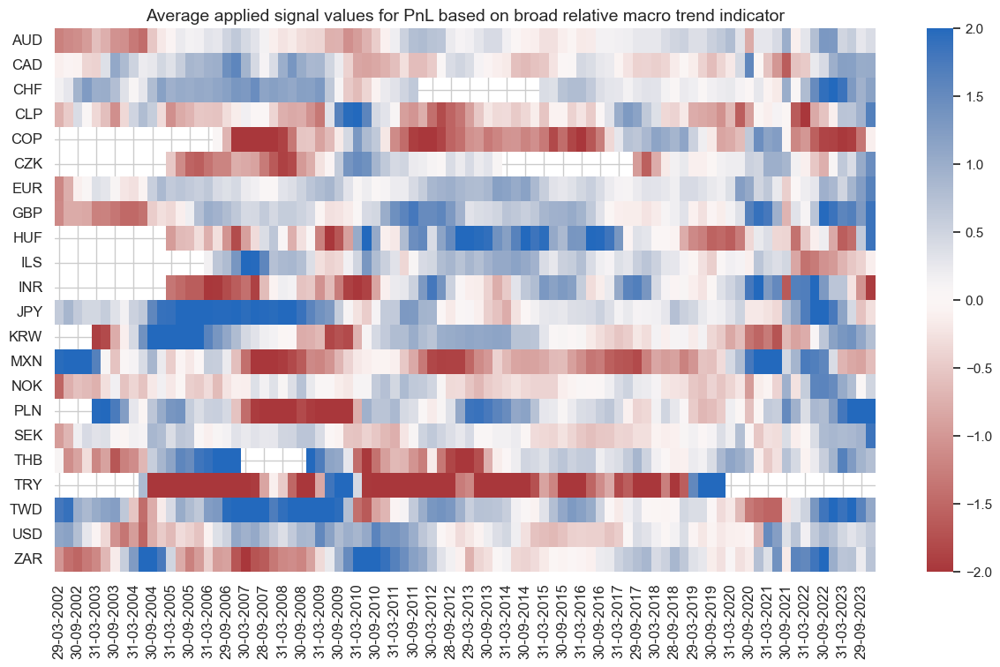

In [89]:
dix = dict_global
pnlx = dix["pnls"]
sigx = dix["sigs"]

pnlx.signal_heatmap(pnl_name="XGHIPCvGLB_PZN", 
                    freq="q", 
                    title=f"Average applied signal values for PnL based on broad relative macro trend indicator",  # Access the first value 
                    figsize=(15, 8))

